# KELOMPOK 3

link dataset: https://drive.google.com/drive/folders/1DhbKVirvnL3Of_rHPwDS_RaYL6xTK3C_?usp=sharing 

## SCRAP BERITA

In [9]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
from newspaper import Article, Config
import time

# --- KONFIGURASI GLOBAL ---
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/115.0.0.0 Safari/537.36'
}

# Config untuk Newspaper3k (Penyedot Isi Berita)
config = Config()
config.browser_user_agent = headers['User-Agent']
config.request_timeout = 10

# List penampung semua data
all_data = []

# --- FUNGSI BANTUAN: AMBIL ISI BERITA ---
def get_content(url):
    try:
        article = Article(url, config=config)
        article.download()
        article.parse()
        # Ambil teks jika panjang > 50 karakter (filter iklan/error)
        return article.text if len(article.text) > 50 else None, article.publish_date
    except:
        return None, None

# --- MEDIA 1: KOMPAS (Struktur: div.articleItem) ---
def scrape_kompas(max_pages=3):
    print("\n--- MEMULAI SCRAPING KOMPAS ---")
    base_url = "https://www.kompas.com/tag/universitas-airlangga?sort=desc&page={}"
    
    for page in range(1, max_pages + 1):
        print(f"Mengakses Halaman {page}...")
        try:
            response = requests.get(base_url.format(page), headers=headers)
            soup = BeautifulSoup(response.content, 'html.parser')
            items = soup.find_all('div', class_='articleItem') # Sesuai Gambar
            
            for item in items:
                try:
                    link_tag = item.find('a', class_='article-link')
                    if link_tag:
                        url = link_tag['href']
                        judul = link_tag.get_text(strip=True)
                        
                        if 'kompas.com' in url and 'video' not in url:
                            print(f"  [Kompas] {judul[:30]}...")
                            isi, tanggal = get_content(url)
                            if isi:
                                all_data.append({'Media': 'Kompas', 'Judul': judul, 'Tanggal': tanggal, 'Isi_Berita': isi, 'Link': url})
                            time.sleep(1)
                except: continue
        except Exception as e: print(f"Error Kompas Page {page}: {e}")

# --- MEDIA 2: CNN INDONESIA (FIXED PAGINATION) ---
def scrape_cnn(max_pages=3):
    print("\n--- MEMULAI SCRAPING CNN INDONESIA ---")
    
    # URL Dasar
    base_tag_url = "https://www.cnnindonesia.com/tag/universitas-airlangga"
    
    for page in range(1, max_pages + 1):
        # LOGIC BARU: Gunakan ?page= untuk halaman 2 ke atas
        if page == 1:
            url_target = base_tag_url
        else:
            url_target = f"{base_tag_url}?page={page}"
            
        print(f"Mengakses Halaman {page}: {url_target}...")
        
        try:
            response = requests.get(url_target, headers=headers)
            
            if response.status_code != 200:
                print(f"  Gagal akses (Status Code: {response.status_code}). Skip.")
                continue

            soup = BeautifulSoup(response.content, 'html.parser')
            items = soup.find_all('article')
            
            if len(items) == 0:
                 # Coba selector alternatif jika article kosong
                 items = soup.find_all('div', class_='list-media_item')
            
            print(f"  -> Menemukan {len(items)} potensi artikel.") 
            
            # Jika halaman 2 ternyata isinya sama persis dengan halaman 1 (bug umum web), kita stop
            if len(items) == 0:
                print("  Tidak ada berita lagi. Berhenti.")
                break

            for item in items:
                try:
                    link_tag = item.find('a')
                    if not link_tag: continue
                    
                    url = link_tag['href']
                    
                    # Judul
                    title_tag = item.find('h2')
                    if not title_tag:
                         title_tag = item.find('div', class_='text-cnn_black_light')    
                    judul = title_tag.get_text(strip=True) if title_tag else "No Title"
                    
                    if 'cnnindonesia.com' in url and '/foto/' not in url and '/video/' not in url:
                        print(f"  [CNN] {judul[:30]}...")
                        isi, tanggal = get_content(url)
                        if isi:
                            all_data.append({'Media': 'CNN Indonesia', 'Judul': judul, 'Tanggal': tanggal, 'Isi_Berita': isi, 'Link': url})
                        time.sleep(1)
                except: continue
                    
        except Exception as e: 
            print(f"Error CNN Page {page}: {e}")

# --- MEDIA 3: BERITAJATIM (Struktur: article.l-post) ---
def scrape_beritajatim(max_pages=3):
    print("\n--- MEMULAI SCRAPING BERITAJATIM ---")
    base_url = "https://beritajatim.com/page/{}/?s=unair"
    
    for page in range(1, max_pages + 1):
        print(f"Mengakses Halaman {page}...")
        try:
            response = requests.get(base_url.format(page), headers=headers)
            if response.status_code != 200: break
            
            soup = BeautifulSoup(response.content, 'html.parser')
            items = soup.find_all('article', class_='l-post') # Sesuai Gambar
            
            for item in items:
                try:
                    h2_tag = item.find('h2', class_='is-title')
                    if h2_tag:
                        link_tag = h2_tag.find('a')
                        if link_tag:
                            url = link_tag['href']
                            judul = link_tag.get_text(strip=True)
                            
                            print(f"  [Beritajatim] {judul[:30]}...")
                            isi, tanggal = get_content(url)
                            if isi:
                                all_data.append({'Media': 'Beritajatim', 'Judul': judul, 'Tanggal': tanggal, 'Isi_Berita': isi, 'Link': url})
                            time.sleep(1)
                except: continue
        except Exception as e: print(f"Error Beritajatim Page {page}: {e}")

# --- EKSEKUSI UTAMA ---
# Anda bisa ubah angka (3) menjadi berapa halaman yang ingin diambil per media
scrape_kompas(15)
scrape_cnn(15)
scrape_beritajatim(15)

# --- SIMPAN DATA ---
if len(all_data) > 0:
    df = pd.DataFrame(all_data)
    # Bersihkan Enter/Spasi berlebih
    df['Isi_Berita'] = df['Isi_Berita'].apply(lambda x: x.replace('\n', ' ').strip())
    
    filename = 'DATASET_UNAIR_LENGKAP.csv'
    df.to_csv(filename, index=False, encoding='utf-8-sig')
    
    print("\n" + "="*50)
    print(f"SELESAI! Total Berita: {len(df)}")
    print(f"Rincian: \n{df['Media'].value_counts()}")
    print(f"File tersimpan sebagai: {filename}")
else:
    print("\nTidak ada data yang berhasil diambil.")


--- MEMULAI SCRAPING KOMPAS ---
Mengakses Halaman 1...
  [Kompas] Banjir Surabaya Saat Musim Huj...
  [Kompas] Pakar Hukum Unair Tolak Peneta...
  [Kompas] Tips Bikin Esai ala Chofifah, ...
  [Kompas] Dosen Sejarah Unair Surabaya: ...
  [Kompas] Gibran Sebut Pembangunan IKN S...
  [Kompas] Gibran Akui Program Pemerintah...
  [Kompas] Peringkat Universitas Terbaik ...
  [Kompas] 10 Universitas Terbaik di Indo...
  [Kompas] Cerita dari Mesuji, Disertasi ...
  [Kompas] Mahasiswa S-3 Hukum Unair Gela...
  [Kompas] 10 Universitas Negeri yang Alu...
  [Kompas] Tanggapi Jokowi, Pakar Ekonomi...
  [Kompas] Pakar Ekonomi dari Unair: Pemb...
  [Kompas] Cerita Fadlyn, Mahasiswa Unair...
  [Kompas] Santri Diduga Ikut Ngecor Ponp...
Mengakses Halaman 2...
  [Kompas] 9 Jurusan S1 Sepi Peminat Unai...
  [Kompas] Kisah Alissa, Raih Gelar S1-S2...
  [Kompas] Unair Buka Pendaftaran Gelomba...
  [Kompas] Biaya Kuliah S2 Unair Semua Ju...
  [Kompas] Sosok Ika, Dosen Fakultas Kepe...
  [Kompas] Fenomena "

## PREPRO

In [1]:
import pandas as pd
import re
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory

# --- 1. LOAD DATA ---
print("1. Membaca data...")
df = pd.read_csv("C:/Users/User/Desktop/KULIAH/SEMESTER 5/DATMIN II/FINAL PROJECT/DATASET_UNAIR_LENGKAP.csv")

# --- 2. PREPROCESSING KHUSUS BERTOPIC ---
# BERTopic butuh kalimat utuh, jadi jangan di-stemming. 
# Cukup buang sampah "Baca juga", "Surabaya Kompas", dll.

def clean_for_bert(text):
    if not isinstance(text, str): return ""
    
    # a. Hapus phrase "Baca juga: ..." sampai akhir kalimat/baris
    text = re.sub(r'Baca juga:.*', '', text, flags=re.IGNORECASE)
    
    # b. Hapus prefix kota/media di awal (contoh: "SURABAYA, KOMPAS.com -")
    text = re.sub(r'^[A-Z\s]+,.*?-', '', text) 
    
    # c. Hapus URL
    text = re.sub(r'http\S+', '', text)
    
    # d. Hapus karakter aneh & spasi ganda
    text = re.sub(r'\s+', ' ', text).strip()
    
    return text

print("2. Membersihkan teks (Cleaning)...")
df['Clean_Content'] = df['Isi_Berita'].apply(clean_for_bert)

# Filter data kosong
df = df[df['Clean_Content'].str.len() > 50]
docs = df['Clean_Content'].tolist()
print(f"   -> Siap memproses {len(docs)} dokumen.")

# --- 3. KONFIGURASI STOPWORD INDONESIA ---
# Agar kata "dan", "yang", "di" tidak muncul sebagai topik
factory = StopWordRemoverFactory()
indo_stopwords = factory.get_stop_words()

# Tambahan stopword spesifik dataset Anda
my_stopwords = indo_stopwords + [
    'surabaya', 'kompas', 'com', 'unair', 'universitas', 'airlangga', 
    'jawa', 'timur', 'indonesia', 'kata', 'ujar', 'tutur', 'senin', 
    'selasa', 'rabu', 'kamis', 'jumat', 'sabtu', 'minggu', 'wib',
    'baca', 'juga', 'page', 'halaman', 'penulis', 'editor', 'berita'
]

# Kita gunakan CountVectorizer untuk memberitahu BERTopic kata apa yang harus diabaikan
vectorizer_model = CountVectorizer(stop_words=my_stopwords)

# --- 4. TRAINING BERTopic ---
print("3. Melatih Model BERTopic (Sedang Clustering & Embedding)...")

# Setup Model
topic_model = BERTopic(
    language="multilingual",        # Wajib untuk Bhs Indonesia
    vectorizer_model=vectorizer_model, # Masukkan stopword tadi
    calculate_probabilities=True,   # Agar bisa visualisasi soft-clustering
    verbose=True
)

# Fit & Transform
topics, probs = topic_model.fit_transform(docs)

# --- 5. MELIHAT HASIL ---
print("\n--- TOP 10 TOPIK YANG DITEMUKAN ---")
freq = topic_model.get_topic_info()
print(freq.head(12))

# --- 6. SIMPAN HASIL KE CSV ---
# Masukkan info topik ke dataframe asli
df['Topic_ID'] = topics
df['Topic_Name'] = df['Topic_ID'].apply(lambda x: topic_model.get_topic(x)[0][0] if x != -1 else "Outlier")

df.to_csv('HASIL_AKHIR_BERTOPIC.csv', index=False)
print("\n-> Hasil analisis tersimpan di 'HASIL_AKHIR_BERTOPIC.csv'")

# --- 7. VISUALISASI ---
print("4. Membuat Visualisasi...")

# a. Bubble Chart (Jarak antar topik)
try:
    fig1 = topic_model.visualize_topics()
    fig1.write_html("1_Bubble_Chart_Topik.html")
    print("   -> 1_Bubble_Chart_Topik.html (Buka di Browser)")
except: print("   Gagal membuat Bubble Chart (Mungkin topik terlalu sedikit)")

# b. Bar Chart (Kata kunci per topik)
try:
    fig2 = topic_model.visualize_barchart(top_n_topics=10)
    fig2.write_html("2_Bar_Chart_KataKunci.html")
    print("   -> 2_Bar_Chart_KataKunci.html (Buka di Browser)")
except: print("   Gagal membuat Bar Chart")

# c. Heatmap (Kemiripan antar topik)
try:
    fig3 = topic_model.visualize_heatmap()
    fig3.write_html("3_Heatmap_Topik.html")
    print("   -> 3_Heatmap_Topik.html (Buka di Browser)")
except: pass

print("\nSELESAI! Silakan buka file HTML yang terbentuk.")

c:\Users\User\Desktop\KULIAH\SEMESTER 5\DATMIN II\datmin2\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2025-11-27 16:48:09,417 - BERTopic - Embedding - Transforming documents to embeddings.


1. Membaca data...
2. Membersihkan teks (Cleaning)...
   -> Siap memproses 417 dokumen.
3. Melatih Model BERTopic (Sedang Clustering & Embedding)...


Batches: 100%|██████████| 14/14 [00:01<00:00, 11.78it/s]
2025-11-27 16:48:20,539 - BERTopic - Embedding - Completed ✓
2025-11-27 16:48:20,541 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-11-27 16:48:28,425 - BERTopic - Dimensionality - Completed ✓
2025-11-27 16:48:28,427 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-11-27 16:48:28,473 - BERTopic - Cluster - Completed ✓
2025-11-27 16:48:28,482 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-11-27 16:48:28,576 - BERTopic - Representation - Completed ✓



--- TOP 10 TOPIK YANG DITEMUKAN ---
   Topic  Count                                 Name  \
0     -1    145      -1_menjadi_hukum_prof_mahasiswa   
1      0     65  0_anak_program_masyarakat_mahasiswa   
2      1     38          1_media_video_publik_rakyat   
3      2     35             2_prof_rektor_guru_besar   
4      3     30              3_vaksin_virus_covid_19   
5      4     29     4_ekonomi_persen_kebijakan_kerja   
6      5     23     5_wisudawan_berhasil_terbaik_ipk   
7      6     19     6_mandiri_jalur_seleksi_prestasi   
8      7     17     7_university_kampus_publikasi_qs   
9      8     16        8_mahasiswa_snbp_seleksi_2025   

                                      Representation  \
0  [menjadi, hukum, prof, mahasiswa, budi, progra...   
1  [anak, program, masyarakat, mahasiswa, teknolo...   
2  [media, video, publik, rakyat, tersebut, suko,...   
3  [prof, rektor, guru, besar, 2025, nasih, ilmu,...   
4  [vaksin, virus, covid, 19, uji, klinis, tbc, p...   
5  [ekonom

In [3]:
import pandas as pd
import re

# 1. BACA FILE MENTAH ANDA
# Sesuaikan path ini dengan lokasi file Anda yang sebenarnya
path_mentah = r'C:/Users/User/Desktop/KULIAH/SEMESTER 5/DATMIN II/FINAL PROJECT/DATASET_UNAIR_LENGKAP.csv'
df = pd.read_csv(path_mentah)

# 2. FUNGSI MEMBERSIHKAN TEKS
def simple_clean(text):
    if not isinstance(text, str): return ""
    # Hapus "Baca juga..." sampai akhir baris
    text = re.sub(r'Baca juga:.*', '', text, flags=re.IGNORECASE)
    # Hapus awalan kota/media (contoh: SURABAYA, KOMPAS.com -)
    text = re.sub(r'^[A-Z\s]+,.*?-', '', text)
    # Hapus angka & simbol aneh (hanya sisakan huruf)
    text = re.sub(r'[^a-zA-Z\s]', ' ', text)
    # Kecilkan huruf & hapus spasi berlebih
    text = re.sub(r'\s+', ' ', text).strip().lower()
    return text

# 3. TERAPKAN PEMBERSIHAN
print("Sedang membersihkan data...")
df['Clean_Content'] = df['Isi_Berita'].apply(simple_clean)

# Hapus baris yang kosong atau terlalu pendek (kurang dari 50 karakter)
df = df[df['Clean_Content'].str.len() > 50]

# 4. SIMPAN JADI FILE BARU
nama_file_baru = 'DATASET_UNAIR_CLEAN.csv'
df.to_csv(nama_file_baru, index=False)

print("="*50)
print(f"BERHASIL! File '{nama_file_baru}' sudah jadi.")
print(f"Sekarang Anda bisa menjalankan script Evaluasi Skor.")

Sedang membersihkan data...
BERHASIL! File 'DATASET_UNAIR_CLEAN.csv' sudah jadi.
Sekarang Anda bisa menjalankan script Evaluasi Skor.


## COBA MODEL DENGAN BERTOPIC SAJA (INDO-SENTENCE BERT)

In [1]:
import pandas as pd
from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer
from sentence_transformers import SentenceTransformer

# 1. LOAD DATA (Pastikan variabel 'docs' sudah ada dari tahap sebelumnya)
# Jika belum, uncomment baris bawah ini:
df = pd.read_csv('DATASET_UNAIR_CLEAN.csv')
docs = df['Clean_Content'].dropna().tolist()

# 2. KONFIGURASI MODEL INDONESIA
print("\n--- TRAINING DENGAN MODEL KHUSUS INDONESIA (Indo-Sentence-BERT) ---")

# --- PERBAIKAN DI SINI ---
# Kita ganti model 'cahya' (yang error/jadul) dengan 'firqaaa/indo-sentence-bert-base'
# Ini adalah model State-of-the-Art untuk sentence embedding Bahasa Indonesia
embedding_model = SentenceTransformer('firqaaa/indo-sentence-bert-base') 

# Setting Vectorizer (Stopwords Indo Lengkap)
stopwords_indo = [
    'yang', 'dan', 'di', 'ke', 'dari', 'ini', 'itu', 'untuk', 'pada', 'adalah',
    'baca', 'juga', 'halaman', 'penulis', 'editor', 'foto', 'video', 'kompas', 
    'cnn', 'beritajatim', 'surabaya', 'unair', 'universitas', 'airlangga', 'prof',
    'dr', 'lewat', 'lanjut', 'selengkapnya', 'simak', 'buka', 'tutup', 'news',
    'kami', 'kita', 'mereka', 'akan', 'bisa', 'ada', 'saat', 'dalam', 'tersebut',
    'oleh', 'secara', 'telah', 'sudah', 'masih', 'jika', 'tak', 'lalu', 'kemudian'
]

# Tambahkan ngram_range=(1, 2) agar frasa seperti "rumah sakit" tertangkap
vectorizer_model = CountVectorizer(stop_words=stopwords_indo, ngram_range=(1, 2))

# 3. JALANKAN BERTopic
print("Sedang melatih model (ini mungkin memakan waktu 1-2 menit)...")
topic_model = BERTopic(
    embedding_model=embedding_model, 
    vectorizer_model=vectorizer_model,
    language="indonesian", # Set eksplisit
    verbose=True
)

topics, probs = topic_model.fit_transform(docs)

# 4. TAMPILKAN HASIL
print("\n=== HASIL TOPIK (METODE Indo-Sentence-BERT) ===")
print(topic_model.get_topic_info().head(10))

# 5. LIHAT KATA KUNCI TOPIK 0 (Topik Terbesar)
print("\nKata Kunci Topik 0:")
print(topic_model.get_topic(0))

c:\Users\User\Desktop\KULIAH\SEMESTER 5\DATMIN II\datmin2\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm




--- TRAINING DENGAN MODEL KHUSUS INDONESIA (Indo-Sentence-BERT) ---


2025-12-09 20:01:10,323 - BERTopic - Embedding - Transforming documents to embeddings.


Sedang melatih model (ini mungkin memakan waktu 1-2 menit)...


Batches: 100%|██████████| 14/14 [00:45<00:00,  3.22s/it]
2025-12-09 20:01:55,491 - BERTopic - Embedding - Completed ✓
2025-12-09 20:01:55,491 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-12-09 20:02:02,638 - BERTopic - Dimensionality - Completed ✓
2025-12-09 20:02:02,640 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-12-09 20:02:02,659 - BERTopic - Cluster - Completed ✓
2025-12-09 20:02:02,667 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-12-09 20:02:02,839 - BERTopic - Representation - Completed ✓



=== HASIL TOPIK (METODE Indo-Sentence-BERT) ===
   Topic  Count                                  Name  \
0     -1     94        -1_dengan_tidak_indonesia_budi   
1      0    124     0_mahasiswa_jalur_seleksi_mandiri   
2      1     77      1_sebagai_dengan_program_menjadi   
3      2     31           2_kasus_korban_dengan_hukum   
4      3     24  3_ekonomi_pemerintah_kebijakan_tidak   
5      4     22               4_vaksin_virus_obat_uji   
6      5     18     5_politik_rakyat_demokrasi_pemilu   
7      6     17     6_gizi_makanan_kesehatan_lailatul   
8      7     10           7_generasi_sosial_media_isu   

                                      Representation  \
0  [dengan, tidak, indonesia, budi, sebagai, fk, ...   
1  [mahasiswa, jalur, seleksi, mandiri, com, juru...   
2  [sebagai, dengan, program, menjadi, mahasiswa,...   
3  [kasus, korban, dengan, hukum, kpk, tidak, ter...   
4  [ekonomi, pemerintah, kebijakan, tidak, kerja,...   
5  [vaksin, virus, obat, uji, covid, tbc, pa

In [2]:
# --- KODE TAMBAHAN: HITUNG COHERENCE SCORE BERTOPIC ---
from gensim.models.coherencemodel import CoherenceModel
import gensim.corpora as corpora

print("\n--- MENGHITUNG SKOR COHERENCE (Cv) ---")

# 1. Siapkan Data untuk Gensim (Tokenisasi)
# Kita perlu tokenisasi ulang data mentah agar dimengerti Gensim
cleaned_docs = [doc.split() for doc in docs] # 'docs' adalah list berita Anda

# 2. Buat Dictionary & Corpus
id2word = corpora.Dictionary(cleaned_docs)
# Filter ekstrem agar lebih stabil (opsional tapi disarankan)
id2word.filter_extremes(no_below=3, no_above=0.85) 
corpus = [id2word.doc2bow(text) for text in cleaned_docs]

# 3. Ekstrak Topik dari BERTopic
# Kita ambil kata-kata kunci dari setiap topik (kecuali topik sampah -1)
topic_info = topic_model.get_topic_info()
bertopic_topics = []

for topic_id in topic_info['Topic']:
    if topic_id != -1: # Hiraukan outlier (-1)
        # Ambil 10 kata teratas dari setiap topik
        words = [word[0] for word in topic_model.get_topic(topic_id)]
        bertopic_topics.append(words)

# 4. Hitung Coherence Score
if bertopic_topics:
    coherence_model = CoherenceModel(
        topics=bertopic_topics, 
        texts=cleaned_docs, 
        dictionary=id2word, 
        coherence='c_v'
    )
    coherence_score = coherence_model.get_coherence()
    
    print(f"✅ Skor Coherence (Cv) BERTopic: {coherence_score:.4f}")
    print(f"   Jumlah Topik Terbentuk: {len(bertopic_topics)}")
else:
    print("❌ Gagal: Tidak ada topik valid yang terbentuk.")


--- MENGHITUNG SKOR COHERENCE (Cv) ---
✅ Skor Coherence (Cv) BERTopic: 0.5193
   Jumlah Topik Terbentuk: 8


## FINAL INDOBERT DENGAN 5 MODEL (INDO-SENTENCE BERT)

c:\Users\User\Desktop\KULIAH\SEMESTER 5\DATMIN II\datmin2\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm



🚀 MEMULAI ANALISIS DATASET NASIONAL (DENGAN INDOBERT)
   -> Berhasil memuat 417 dokumen.

1. Cleaning & Bigram Processing...
   -> Siap memproses 417 dokumen bersih.

2. Optimasi 5 Model (Iterasi K=2-12)...
-------------------------------------------------------------------------------------
K   | LDA     | NMF     | LSA     | PLSA    | KMeans 
-------------------------------------------------------------------------------------


  9%|▉         | 1/11 [01:11<11:52, 71.23s/it]

2   | 0.3308  | 0.5634  | 0.5674  | 0.4041  | 0.4047


 18%|█▊        | 2/11 [02:20<10:32, 70.22s/it]

3   | 0.3250  | 0.4848  | 0.5814  | 0.4464  | 0.4623


 27%|██▋       | 3/11 [03:29<09:16, 69.56s/it]

4   | 0.3965  | 0.4355  | 0.5441  | 0.4046  | 0.4114


 36%|███▋      | 4/11 [04:54<08:50, 75.74s/it]

5   | 0.3919  | 0.5078  | 0.5205  | 0.3796  | 0.4192


 45%|████▌     | 5/11 [06:27<08:11, 81.92s/it]

6   | 0.3945  | 0.5193  | 0.5245  | 0.3852  | 0.4497


 55%|█████▍    | 6/11 [07:43<06:39, 79.81s/it]

7   | 0.3329  | 0.5302  | 0.4369  | 0.3892  | 0.4862


 64%|██████▎   | 7/11 [08:57<05:11, 77.99s/it]

8   | 0.3117  | 0.5586  | 0.4469  | 0.5113  | 0.4378


 73%|███████▎  | 8/11 [10:11<03:49, 76.56s/it]

9   | 0.3744  | 0.5889  | 0.4140  | 0.3920  | 0.4872


 82%|████████▏ | 9/11 [11:35<02:38, 79.01s/it]

10  | 0.3956  | 0.6036  | 0.4122  | 0.4456  | 0.4909


 91%|█████████ | 10/11 [13:09<01:23, 83.76s/it]

11  | 0.3560  | 0.6124  | 0.3900  | 0.4446  | 0.5064


100%|██████████| 11/11 [14:48<00:00, 80.80s/it]

12  | 0.3509  | 0.5912  | 0.3705  | 0.4338  | 0.4917

🏆 JUARA SEMENTARA (Non-BERT): NMF (K=11, Score=0.6124)

3. Menguji BERTopic dengan IndoBERT (Challenger)...
   [INFO] Mendownload/Memuat Model IndoBERT...



2025-12-15 12:47:11,521 - BERTopic - Embedding - Transforming documents to embeddings.
Batches: 100%|██████████| 14/14 [00:35<00:00,  2.54s/it]
2025-12-15 12:47:47,091 - BERTopic - Embedding - Completed ✓
2025-12-15 12:47:47,091 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-12-15 12:47:54,615 - BERTopic - Dimensionality - Completed ✓
2025-12-15 12:47:54,617 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-12-15 12:47:54,632 - BERTopic - Cluster - Completed ✓
2025-12-15 12:47:54,635 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-12-15 12:47:54,876 - BERTopic - Representation - Completed ✓


   -> Skor BERTopic (IndoBERT): 0.5212

👑 JUARA UMUM FINAL: NMF
   Jumlah Topik (K): 11
   Coherence Score : 0.6124

=== DAFTAR TOPIK: NMF ===
Topik 1: kebijakan, pemerintah, negara, masyarakat, publik, ekonomi, harus, politik, indonesia, komunikasi
Topik 2: jalur_mandiri, seleksi_mandiri, calon_mahasiswa, mandiri, nasional_berdasarkan, snbp, prestasi, mendaftar_jalur, kamu, seleksi
Topik 3: wisudawan_terbaik, wisudawan, berhasil, wisuda, yudhoyono, studi, indeks_prestasi, kumulatif, menjalani, pendidikan
Topik 4: korban, gilang, kasus, nyalla, surat, hukum, belum, diduga, pelecehan_seksual, plastik
Topik 5: mahasiswa, desa, inovasi, warga, teknologi, kegiatan, produk, digital, aplikasi, lingkungan
Topik 6: kampus, pemeringkatan, peringkat, rankings, indikator, dunia, publikasi, world_university, university, perguruan_tinggi
Topik 7: budi, kedokteran, budi_santoso, dokter, dekan, banyuwangi, fakultas_kedokteran, guru, karangan_bunga, fikkia
Topik 8: vaksin, vaksin_merah, putih, klinis,

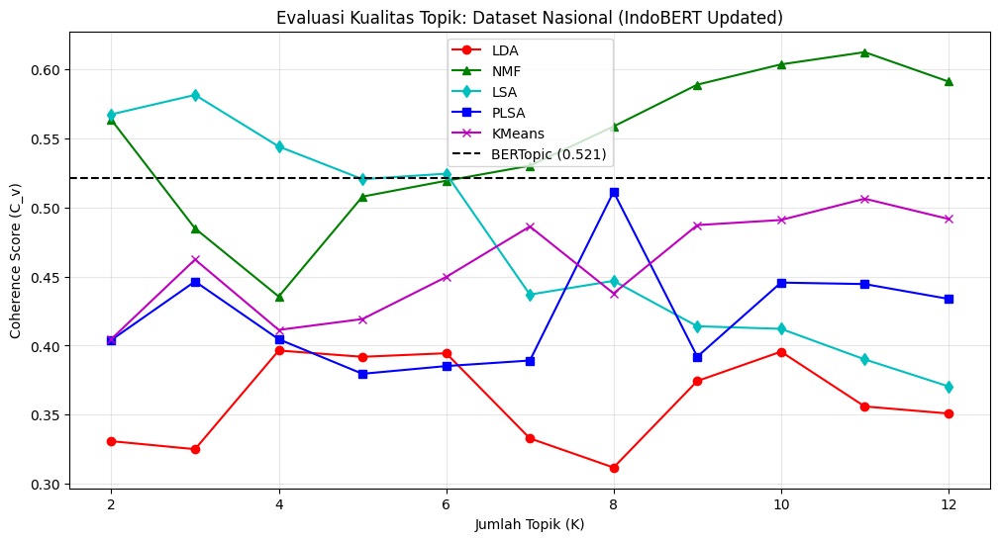

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
from tqdm import tqdm

# Library Modeling
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF, TruncatedSVD
from sklearn.cluster import KMeans
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer # <--- TAMBAHAN UNTUK INDOBERT

# Library Evaluasi
import gensim
import gensim.corpora as corpora
from gensim.models.coherencemodel import CoherenceModel
from gensim.models.phrases import Phrases, Phraser

# ==============================================================================
# 1. LOAD DATA & ADVANCED PREPROCESSING (INDONESIA)
# ==============================================================================
print("🚀 MEMULAI ANALISIS DATASET NASIONAL (DENGAN INDOBERT)")
print("="*60)

# --- A. STOPWORDS AGRESIF (Bahasa Indonesia) ---
stopwords_indo = set([
    'yang', 'dan', 'di', 'ke', 'dari', 'ini', 'itu', 'untuk', 'pada', 'adalah',
    'baca', 'juga', 'halaman', 'penulis', 'editor', 'foto', 'video', 'kompas', 
    'cnn', 'beritajatim', 'surabaya', 'unair', 'universitas', 'airlangga', 'prof',
    'dr', 'lewat', 'lanjut', 'selengkapnya', 'simak', 'buka', 'tutup', 'news',
    'kami', 'kita', 'mereka', 'akan', 'bisa', 'ada', 'saat', 'dalam', 'dengan',
    'tidak', 'menjadi', 'sebagai', 'bahwa', 'lebih', 'sosial', 'program', 'bagi',
    'atau', 'karena', 'namun', 'ia', 'dia', 'pihaknya', 'saya', 'anda', 'hal',
    'tersebut', 'oleh', 'secara', 'telah', 'sudah', 'masih', 'jika', 'tak',
    'lalu', 'kemudian', 'seperti', 'saja', 'mulai', 'hingga', 'sampai',
    'terhadap', 'dilakukan', 'melakukan', 'antara', 'setelah', 'beberapa',
    'selama', 'selain', 'banyak', 'perlu', 'dapat', 'kata', 'ujar', 'tutur',
    'menurut', 'mengatakan', 'kepada', 'sehingga', 'sangat', 'agar', 'pun',
    'sedang', 'besar', 'salah', 'satu', 'para', 'wib', 'jumat', 'senin',
    'selasa', 'rabu', 'kamis', 'sabtu', 'minggu', 'januari', 'februari',
    'maret', 'april', 'mei', 'juni', 'juli', 'agustus', 'september', 
    'oktober', 'november', 'desember', 'tahun', 'hari', 'tanggal', 'waktu'
])

# --- B. LOAD FILE ---
try:
    df = pd.read_csv('DATASET_UNAIR_CLEAN.csv')
    col_target = 'Clean_Content' if 'Clean_Content' in df.columns else 'Isi_Berita'
    docs_raw = df[col_target].dropna().tolist()
    print(f"   -> Berhasil memuat {len(docs_raw)} dokumen.")
except Exception as e:
    print(f"   [ERROR] Gagal membaca file: {e}")
    docs_raw = []

# --- C. CLEANING & BIGRAMS ---
if docs_raw:
    print("\n1. Cleaning & Bigram Processing...")
    
    def clean_text_indo(text):
        if not isinstance(text, str): return ""
        text = text.lower()
        text = re.sub(r'baca juga:.*', '', text)
        text = re.sub(r'http\S+', '', text)
        text = re.sub(r'[^a-z\s]', ' ', text)
        text = ' '.join([w for w in text.split() if len(w) > 3 and w not in stopwords_indo])
        return text.strip()

    clean_docs = [clean_text_indo(d) for d in docs_raw]
    clean_docs = [d for d in clean_docs if len(d) > 30] 
    
    # Bigrams
    tokenized = [doc.split() for doc in clean_docs]
    phrases = Phrases(tokenized, min_count=5, threshold=10)
    bigram = Phraser(phrases)
    data_bigrams = [bigram[doc] for doc in tokenized]
    docs_final = [" ".join(doc) for doc in data_bigrams]
    
    # Dictionary
    id2word = corpora.Dictionary(data_bigrams)
    id2word.filter_extremes(no_below=3, no_above=0.85)
    
    print(f"   -> Siap memproses {len(docs_final)} dokumen bersih.")

    # ==============================================================================
    # 2. OPTIMASI 5 MODEL (K=2 s.d 12)
    # ==============================================================================
    print("\n2. Optimasi 5 Model (Iterasi K=2-12)...")
    
    tf_vec = CountVectorizer(max_df=0.95, min_df=2)
    tfidf_vec = TfidfVectorizer(max_df=0.95, min_df=2)
    tf = tf_vec.fit_transform(docs_final)
    tfidf = tfidf_vec.fit_transform(docs_final)
    feat_names = tfidf_vec.get_feature_names_out()
    tf_names = tf_vec.get_feature_names_out() 
    
    results = {'k': [], 'LDA_Coh': [], 'NMF_Coh': [], 'LSA_Coh': [], 'PLSA_Coh': [], 'KMeans_Coh': []}
    
    print("-" * 85)
    print(f"{'K':<3} | {'LDA':<7} | {'NMF':<7} | {'LSA':<7} | {'PLSA':<7} | {'KMeans':<7}")
    print("-" * 85)

    for k in tqdm(range(2, 13)):
        results['k'].append(k)
        
        # 1. LDA
        lda = LatentDirichletAllocation(n_components=k, random_state=42).fit(tf)
        t_lda = [[tf_names[i] for i in t.argsort()[:-11:-1]] for t in lda.components_]
        s_lda = CoherenceModel(topics=t_lda, texts=data_bigrams, dictionary=id2word, coherence='c_v').get_coherence()
        results['LDA_Coh'].append(s_lda)
        
        # 2. NMF
        nmf = NMF(n_components=k, init='nndsvd', random_state=42).fit(tfidf)
        t_nmf = [[feat_names[i] for i in t.argsort()[:-11:-1]] for t in nmf.components_]
        s_nmf = CoherenceModel(topics=t_nmf, texts=data_bigrams, dictionary=id2word, coherence='c_v').get_coherence()
        results['NMF_Coh'].append(s_nmf)
        
        # 3. LSA
        lsa = TruncatedSVD(n_components=k, random_state=42).fit(tfidf)
        t_lsa = [[feat_names[i] for i in t.argsort()[:-11:-1]] for t in lsa.components_]
        s_lsa = CoherenceModel(topics=t_lsa, texts=data_bigrams, dictionary=id2word, coherence='c_v').get_coherence()
        results['LSA_Coh'].append(s_lsa)
        
        # 4. PLSA
        plsa = NMF(n_components=k, solver='mu', beta_loss='kullback-leibler', random_state=42).fit(tfidf)
        t_plsa = [[feat_names[i] for i in t.argsort()[:-11:-1]] for t in plsa.components_]
        s_plsa = CoherenceModel(topics=t_plsa, texts=data_bigrams, dictionary=id2word, coherence='c_v').get_coherence()
        results['PLSA_Coh'].append(s_plsa)
        
        # 5. KMeans
        km = KMeans(n_clusters=k, random_state=42, n_init=10).fit(tfidf)
        ct = km.cluster_centers_.argsort()[:, ::-1]
        t_km = [[feat_names[ind] for ind in ct[i, :10]] for i in range(k)]
        s_km = CoherenceModel(topics=t_km, texts=data_bigrams, dictionary=id2word, coherence='c_v').get_coherence()
        results['KMeans_Coh'].append(s_km)
        
        print(f"{k:<3} | {s_lda:.4f}  | {s_nmf:.4f}  | {s_lsa:.4f}  | {s_plsa:.4f}  | {s_km:.4f}")

    # ==============================================================================
    # 3. PENENTUAN JUARA & VISUALISASI
    # ==============================================================================
    
    # Cari Pemenang Sementara
    scores = {m: max(results[f'{m}_Coh']) for m in ['LDA', 'NMF', 'LSA', 'PLSA', 'KMeans']}
    winner = max(scores, key=scores.get)
    best_k = results['k'][results[f'{winner}_Coh'].index(scores[winner])]
    
    print(f"\n🏆 JUARA SEMENTARA (Non-BERT): {winner} (K={best_k}, Score={scores[winner]:.4f})")
    
    # --- UPDATE: UJI BERTopic DENGAN IndoBERT ---
    print("\n3. Menguji BERTopic dengan IndoBERT (Challenger)...")
    bert_score = 0
    try:
        # A. Load Model Khusus Indonesia (firqaaa/indo-sentence-bert-base)
        print("   [INFO] Mendownload/Memuat Model IndoBERT...")
        # Gunakan 'paraphrase-multilingual-MiniLM-L12-v2' jika firqaaa error/lambat
        embedding_model = SentenceTransformer('firqaaa/indo-sentence-bert-base')
        
        # B. Setup Vectorizer (Biar adil stopword-nya sama)
        vec_model = CountVectorizer(stop_words=list(stopwords_indo), ngram_range=(1, 2))
        
        # C. Training BERTopic
        bert = BERTopic(
            embedding_model=embedding_model, # <--- KEKUATAN UTAMA (IndoBERT)
            vectorizer_model=vec_model,
            language="indonesian", # Set eksplisit
            verbose=True
        )
        bert.fit_transform(docs_final)
        
        # D. Ekstrak Topik & Hitung Coherence
        b_info = bert.get_topic_info()
        b_topics = []
        for t in b_info[b_info['Topic'] != -1]['Topic']:
            words = [w[0] for w in bert.get_topic(t)]
            b_topics.append(words)
            
        if b_topics:
            bert_score = CoherenceModel(topics=b_topics, texts=data_bigrams, dictionary=id2word, coherence='c_v').get_coherence()
            print(f"   -> Skor BERTopic (IndoBERT): {bert_score:.4f}")
            
            if bert_score > scores[winner]:
                winner, best_k, scores[winner] = "BERTopic (IndoBERT)", len(b_topics), bert_score
        else:
            print("   -> BERTopic gagal (topik tidak valid).")
            
    except Exception as e:
        print(f"   -> BERTopic Error: {e}")
        print("   -> Lanjut menggunakan Juara Sementara.")

    print("\n" + "="*50)
    print(f"👑 JUARA UMUM FINAL: {winner}")
    print(f"   Jumlah Topik (K): {best_k}")
    print(f"   Coherence Score : {scores[winner]:.4f}")
    print("="*50)
    
    # Cetak Topik Pemenang
    print(f"\n=== DAFTAR TOPIK: {winner} ===")
    if "BERTopic" in winner:
        print(bert.get_topic_info().head(10))
    else:
        # Re-train pemenang
        if winner=='NMF': model = NMF(n_components=best_k, init='nndsvd', random_state=42).fit(tfidf)
        elif winner=='LSA': model = TruncatedSVD(n_components=best_k, random_state=42).fit(tfidf)
        elif winner=='LDA': model = LatentDirichletAllocation(n_components=best_k, random_state=42).fit(tf)
        elif winner=='PLSA': model = NMF(n_components=best_k, solver='mu', beta_loss='kullback-leibler', random_state=42).fit(tfidf)
        elif winner=='KMeans': 
            model = KMeans(n_clusters=best_k, random_state=42).fit(tfidf)
            ct = model.cluster_centers_.argsort()[:, ::-1]
            for i in range(best_k): print(f"Topik {i+1}: {', '.join([feat_names[x] for x in ct[i, :10]])}")
            
        if "BERTopic" not in winner and winner != 'KMeans':
            names = tf_names if winner == 'LDA' else feat_names
            for i, t in enumerate(model.components_):
                print(f"Topik {i+1}: {', '.join([names[x] for x in t.argsort()[:-11:-1]])}")

    # Grafik Evaluasi
    plt.figure(figsize=(12, 6))
    plt.plot(results['k'], results['LDA_Coh'], 'r-o', label='LDA')
    plt.plot(results['k'], results['NMF_Coh'], 'g-^', label='NMF')
    plt.plot(results['k'], results['LSA_Coh'], 'c-d', label='LSA')
    plt.plot(results['k'], results['PLSA_Coh'], 'b-s', label='PLSA')
    plt.plot(results['k'], results['KMeans_Coh'], 'm-x', label='KMeans')
    if bert_score > 0: plt.axhline(y=bert_score, color='black', linestyle='--', label=f'BERTopic ({bert_score:.3f})')
    
    plt.title('Evaluasi Kualitas Topik: Dataset Nasional (IndoBERT Updated)')
    plt.xlabel('Jumlah Topik (K)')
    plt.ylabel('Coherence Score (C_v)')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.savefig('EVALUASI_NASIONAL_INDOBERT.png')
    print("\nGrafik tersimpan: EVALUASI_NASIONAL_INDOBERT.png")
    plt.show()

else:
    print("Tidak ada data untuk diproses.")

## BANDINGIN DENGAN INDOBERT LEM

🚀 MEMULAI ANALISIS DATASET NASIONAL (DENGAN INDOBERT)
   -> Berhasil memuat 417 dokumen.

1. Cleaning & Bigram Processing...
   -> Siap memproses 417 dokumen bersih.

2. Optimasi 5 Model (Iterasi K=2-12)...
-------------------------------------------------------------------------------------
K   | LDA     | NMF     | LSA     | PLSA    | KMeans 
-------------------------------------------------------------------------------------


  9%|▉         | 1/11 [01:17<12:50, 77.01s/it]

2   | 0.3308  | 0.5634  | 0.5674  | 0.4041  | 0.4047


 18%|█▊        | 2/11 [02:39<12:01, 80.17s/it]

3   | 0.3250  | 0.4848  | 0.5814  | 0.4464  | 0.4623


 27%|██▋       | 3/11 [03:55<10:27, 78.44s/it]

4   | 0.3965  | 0.4355  | 0.5441  | 0.4046  | 0.4114


 36%|███▋      | 4/11 [05:12<09:04, 77.78s/it]

5   | 0.3919  | 0.5078  | 0.5205  | 0.3796  | 0.4192


 45%|████▌     | 5/11 [06:35<07:58, 79.69s/it]

6   | 0.3945  | 0.5193  | 0.5245  | 0.3852  | 0.4497


 55%|█████▍    | 6/11 [07:49<06:29, 77.87s/it]

7   | 0.3329  | 0.5302  | 0.4369  | 0.3892  | 0.4862


 64%|██████▎   | 7/11 [09:06<05:10, 77.55s/it]

8   | 0.3117  | 0.5586  | 0.4469  | 0.5113  | 0.4378


 73%|███████▎  | 8/11 [10:23<03:52, 77.38s/it]

9   | 0.3744  | 0.5889  | 0.4140  | 0.3920  | 0.4872


 82%|████████▏ | 9/11 [11:38<02:32, 76.37s/it]

10  | 0.3956  | 0.6036  | 0.4122  | 0.4456  | 0.4909


 91%|█████████ | 10/11 [12:56<01:16, 76.92s/it]

11  | 0.3560  | 0.6124  | 0.3900  | 0.4446  | 0.5064


100%|██████████| 11/11 [14:17<00:00, 77.97s/it]

12  | 0.3509  | 0.5912  | 0.3705  | 0.4338  | 0.4917

🏆 JUARA SEMENTARA (Non-BERT): NMF (K=11, Score=0.6124)

3. Menguji BERTopic dengan IndoBERT (Challenger)...
   [INFO] Mendownload/Memuat Model IndoBERT...



No sentence-transformers model found with name indolem/indobert-base-uncased. Creating a new one with mean pooling.
2025-12-09 20:43:32,836 - BERTopic - Embedding - Transforming documents to embeddings.
Batches: 100%|██████████| 14/14 [00:35<00:00,  2.54s/it]
2025-12-09 20:44:08,392 - BERTopic - Embedding - Completed ✓
2025-12-09 20:44:08,392 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-12-09 20:44:08,767 - BERTopic - Dimensionality - Completed ✓
2025-12-09 20:44:08,768 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-12-09 20:44:08,786 - BERTopic - Cluster - Completed ✓
2025-12-09 20:44:08,790 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-12-09 20:44:08,948 - BERTopic - Representation - Completed ✓


   -> Skor BERTopic (IndoBERT): 0.2864

👑 JUARA UMUM FINAL: NMF
   Jumlah Topik (K): 11
   Coherence Score : 0.6124

=== DAFTAR TOPIK: NMF ===
Topik 1: kebijakan, pemerintah, negara, masyarakat, publik, ekonomi, harus, politik, indonesia, komunikasi
Topik 2: jalur_mandiri, seleksi_mandiri, calon_mahasiswa, mandiri, nasional_berdasarkan, snbp, prestasi, mendaftar_jalur, kamu, seleksi
Topik 3: wisudawan_terbaik, wisudawan, berhasil, wisuda, yudhoyono, studi, indeks_prestasi, kumulatif, menjalani, pendidikan
Topik 4: korban, gilang, kasus, nyalla, surat, hukum, belum, diduga, pelecehan_seksual, plastik
Topik 5: mahasiswa, desa, inovasi, warga, teknologi, kegiatan, produk, digital, aplikasi, lingkungan
Topik 6: kampus, pemeringkatan, peringkat, rankings, indikator, dunia, publikasi, world_university, university, perguruan_tinggi
Topik 7: budi, kedokteran, budi_santoso, dokter, dekan, banyuwangi, fakultas_kedokteran, guru, karangan_bunga, fikkia
Topik 8: vaksin, vaksin_merah, putih, klinis,

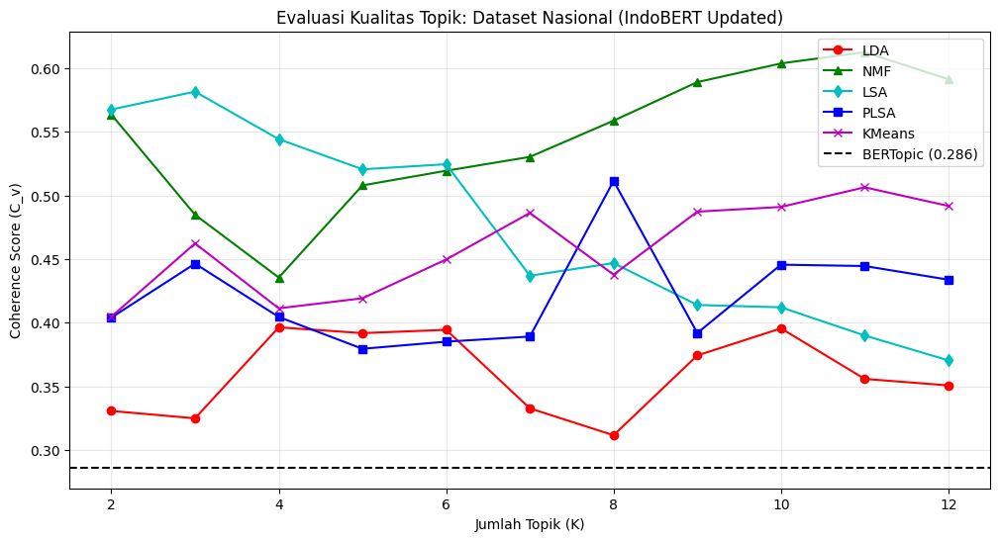

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
from tqdm import tqdm

# Library Modeling
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF, TruncatedSVD
from sklearn.cluster import KMeans
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer # <--- TAMBAHAN UNTUK INDOBERT

# Library Evaluasi
import gensim
import gensim.corpora as corpora
from gensim.models.coherencemodel import CoherenceModel
from gensim.models.phrases import Phrases, Phraser

# ==============================================================================
# 1. LOAD DATA & ADVANCED PREPROCESSING (INDONESIA)
# ==============================================================================
print("🚀 MEMULAI ANALISIS DATASET NASIONAL (DENGAN INDOBERT)")
print("="*60)

# --- A. STOPWORDS AGRESIF (Bahasa Indonesia) ---
stopwords_indo = set([
    'yang', 'dan', 'di', 'ke', 'dari', 'ini', 'itu', 'untuk', 'pada', 'adalah',
    'baca', 'juga', 'halaman', 'penulis', 'editor', 'foto', 'video', 'kompas', 
    'cnn', 'beritajatim', 'surabaya', 'unair', 'universitas', 'airlangga', 'prof',
    'dr', 'lewat', 'lanjut', 'selengkapnya', 'simak', 'buka', 'tutup', 'news',
    'kami', 'kita', 'mereka', 'akan', 'bisa', 'ada', 'saat', 'dalam', 'dengan',
    'tidak', 'menjadi', 'sebagai', 'bahwa', 'lebih', 'sosial', 'program', 'bagi',
    'atau', 'karena', 'namun', 'ia', 'dia', 'pihaknya', 'saya', 'anda', 'hal',
    'tersebut', 'oleh', 'secara', 'telah', 'sudah', 'masih', 'jika', 'tak',
    'lalu', 'kemudian', 'seperti', 'saja', 'mulai', 'hingga', 'sampai',
    'terhadap', 'dilakukan', 'melakukan', 'antara', 'setelah', 'beberapa',
    'selama', 'selain', 'banyak', 'perlu', 'dapat', 'kata', 'ujar', 'tutur',
    'menurut', 'mengatakan', 'kepada', 'sehingga', 'sangat', 'agar', 'pun',
    'sedang', 'besar', 'salah', 'satu', 'para', 'wib', 'jumat', 'senin',
    'selasa', 'rabu', 'kamis', 'sabtu', 'minggu', 'januari', 'februari',
    'maret', 'april', 'mei', 'juni', 'juli', 'agustus', 'september', 
    'oktober', 'november', 'desember', 'tahun', 'hari', 'tanggal', 'waktu'
])

# --- B. LOAD FILE ---
try:
    df = pd.read_csv('DATASET_UNAIR_CLEAN.csv')
    col_target = 'Clean_Content' if 'Clean_Content' in df.columns else 'Isi_Berita'
    docs_raw = df[col_target].dropna().tolist()
    print(f"   -> Berhasil memuat {len(docs_raw)} dokumen.")
except Exception as e:
    print(f"   [ERROR] Gagal membaca file: {e}")
    docs_raw = []

# --- C. CLEANING & BIGRAMS ---
if docs_raw:
    print("\n1. Cleaning & Bigram Processing...")
    
    def clean_text_indo(text):
        if not isinstance(text, str): return ""
        text = text.lower()
        text = re.sub(r'baca juga:.*', '', text)
        text = re.sub(r'http\S+', '', text)
        text = re.sub(r'[^a-z\s]', ' ', text)
        text = ' '.join([w for w in text.split() if len(w) > 3 and w not in stopwords_indo])
        return text.strip()

    clean_docs = [clean_text_indo(d) for d in docs_raw]
    clean_docs = [d for d in clean_docs if len(d) > 30] 
    
    # Bigrams
    tokenized = [doc.split() for doc in clean_docs]
    phrases = Phrases(tokenized, min_count=5, threshold=10)
    bigram = Phraser(phrases)
    data_bigrams = [bigram[doc] for doc in tokenized]
    docs_final = [" ".join(doc) for doc in data_bigrams]
    
    # Dictionary
    id2word = corpora.Dictionary(data_bigrams)
    id2word.filter_extremes(no_below=3, no_above=0.85)
    
    print(f"   -> Siap memproses {len(docs_final)} dokumen bersih.")

    # ==============================================================================
    # 2. OPTIMASI 5 MODEL (K=2 s.d 12)
    # ==============================================================================
    print("\n2. Optimasi 5 Model (Iterasi K=2-12)...")
    
    tf_vec = CountVectorizer(max_df=0.95, min_df=2)
    tfidf_vec = TfidfVectorizer(max_df=0.95, min_df=2)
    tf = tf_vec.fit_transform(docs_final)
    tfidf = tfidf_vec.fit_transform(docs_final)
    feat_names = tfidf_vec.get_feature_names_out()
    tf_names = tf_vec.get_feature_names_out() 
    
    results = {'k': [], 'LDA_Coh': [], 'NMF_Coh': [], 'LSA_Coh': [], 'PLSA_Coh': [], 'KMeans_Coh': []}
    
    print("-" * 85)
    print(f"{'K':<3} | {'LDA':<7} | {'NMF':<7} | {'LSA':<7} | {'PLSA':<7} | {'KMeans':<7}")
    print("-" * 85)

    for k in tqdm(range(2, 13)):
        results['k'].append(k)
        
        # 1. LDA
        lda = LatentDirichletAllocation(n_components=k, random_state=42).fit(tf)
        t_lda = [[tf_names[i] for i in t.argsort()[:-11:-1]] for t in lda.components_]
        s_lda = CoherenceModel(topics=t_lda, texts=data_bigrams, dictionary=id2word, coherence='c_v').get_coherence()
        results['LDA_Coh'].append(s_lda)
        
        # 2. NMF
        nmf = NMF(n_components=k, init='nndsvd', random_state=42).fit(tfidf)
        t_nmf = [[feat_names[i] for i in t.argsort()[:-11:-1]] for t in nmf.components_]
        s_nmf = CoherenceModel(topics=t_nmf, texts=data_bigrams, dictionary=id2word, coherence='c_v').get_coherence()
        results['NMF_Coh'].append(s_nmf)
        
        # 3. LSA
        lsa = TruncatedSVD(n_components=k, random_state=42).fit(tfidf)
        t_lsa = [[feat_names[i] for i in t.argsort()[:-11:-1]] for t in lsa.components_]
        s_lsa = CoherenceModel(topics=t_lsa, texts=data_bigrams, dictionary=id2word, coherence='c_v').get_coherence()
        results['LSA_Coh'].append(s_lsa)
        
        # 4. PLSA
        plsa = NMF(n_components=k, solver='mu', beta_loss='kullback-leibler', random_state=42).fit(tfidf)
        t_plsa = [[feat_names[i] for i in t.argsort()[:-11:-1]] for t in plsa.components_]
        s_plsa = CoherenceModel(topics=t_plsa, texts=data_bigrams, dictionary=id2word, coherence='c_v').get_coherence()
        results['PLSA_Coh'].append(s_plsa)
        
        # 5. KMeans
        km = KMeans(n_clusters=k, random_state=42, n_init=10).fit(tfidf)
        ct = km.cluster_centers_.argsort()[:, ::-1]
        t_km = [[feat_names[ind] for ind in ct[i, :10]] for i in range(k)]
        s_km = CoherenceModel(topics=t_km, texts=data_bigrams, dictionary=id2word, coherence='c_v').get_coherence()
        results['KMeans_Coh'].append(s_km)
        
        print(f"{k:<3} | {s_lda:.4f}  | {s_nmf:.4f}  | {s_lsa:.4f}  | {s_plsa:.4f}  | {s_km:.4f}")

    # ==============================================================================
    # 3. PENENTUAN JUARA & VISUALISASI
    # ==============================================================================
    
    # Cari Pemenang Sementara
    scores = {m: max(results[f'{m}_Coh']) for m in ['LDA', 'NMF', 'LSA', 'PLSA', 'KMeans']}
    winner = max(scores, key=scores.get)
    best_k = results['k'][results[f'{winner}_Coh'].index(scores[winner])]
    
    print(f"\n🏆 JUARA SEMENTARA (Non-BERT): {winner} (K={best_k}, Score={scores[winner]:.4f})")
    
    # --- UPDATE: UJI BERTopic DENGAN IndoBERT ---
    print("\n3. Menguji BERTopic dengan IndoBERT (Challenger)...")
    bert_score = 0
    try:
        # A. Load Model Khusus Indonesia (firqaaa/indo-sentence-bert-base)
        print("   [INFO] Mendownload/Memuat Model IndoBERT...")
        # Gunakan 'paraphrase-multilingual-MiniLM-L12-v2' jika firqaaa error/lambat
        embedding_model = SentenceTransformer('firqaaa/indo-sentence-bert-base')
        
        # B. Setup Vectorizer (Biar adil stopword-nya sama)
        vec_model = CountVectorizer(stop_words=list(stopwords_indo), ngram_range=(1, 2))
        
        # C. Training BERTopic
        bert = BERTopic(
            embedding_model=embedding_model, # <--- KEKUATAN UTAMA (IndoBERT)
            vectorizer_model=vec_model,
            language="indonesian", # Set eksplisit
            verbose=True
        )
        bert.fit_transform(docs_final)
        
        # D. Ekstrak Topik & Hitung Coherence
        b_info = bert.get_topic_info()
        b_topics = []
        for t in b_info[b_info['Topic'] != -1]['Topic']:
            words = [w[0] for w in bert.get_topic(t)]
            b_topics.append(words)
            
        if b_topics:
            bert_score = CoherenceModel(topics=b_topics, texts=data_bigrams, dictionary=id2word, coherence='c_v').get_coherence()
            print(f"   -> Skor BERTopic (IndoBERT): {bert_score:.4f}")
            
            if bert_score > scores[winner]:
                winner, best_k, scores[winner] = "BERTopic (IndoBERT)", len(b_topics), bert_score
        else:
            print("   -> BERTopic gagal (topik tidak valid).")
            
    except Exception as e:
        print(f"   -> BERTopic Error: {e}")
        print("   -> Lanjut menggunakan Juara Sementara.")

    print("\n" + "="*50)
    print(f"👑 JUARA UMUM FINAL: {winner}")
    print(f"   Jumlah Topik (K): {best_k}")
    print(f"   Coherence Score : {scores[winner]:.4f}")
    print("="*50)
    
    # Cetak Topik Pemenang
    print(f"\n=== DAFTAR TOPIK: {winner} ===")
    if "BERTopic" in winner:
        print(bert.get_topic_info().head(10))
    else:
        # Re-train pemenang
        if winner=='NMF': model = NMF(n_components=best_k, init='nndsvd', random_state=42).fit(tfidf)
        elif winner=='LSA': model = TruncatedSVD(n_components=best_k, random_state=42).fit(tfidf)
        elif winner=='LDA': model = LatentDirichletAllocation(n_components=best_k, random_state=42).fit(tf)
        elif winner=='PLSA': model = NMF(n_components=best_k, solver='mu', beta_loss='kullback-leibler', random_state=42).fit(tfidf)
        elif winner=='KMeans': 
            model = KMeans(n_clusters=best_k, random_state=42).fit(tfidf)
            ct = model.cluster_centers_.argsort()[:, ::-1]
            for i in range(best_k): print(f"Topik {i+1}: {', '.join([feat_names[x] for x in ct[i, :10]])}")
            
        if "BERTopic" not in winner and winner != 'KMeans':
            names = tf_names if winner == 'LDA' else feat_names
            for i, t in enumerate(model.components_):
                print(f"Topik {i+1}: {', '.join([names[x] for x in t.argsort()[:-11:-1]])}")

    # Grafik Evaluasi
    plt.figure(figsize=(12, 6))
    plt.plot(results['k'], results['LDA_Coh'], 'r-o', label='LDA')
    plt.plot(results['k'], results['NMF_Coh'], 'g-^', label='NMF')
    plt.plot(results['k'], results['LSA_Coh'], 'c-d', label='LSA')
    plt.plot(results['k'], results['PLSA_Coh'], 'b-s', label='PLSA')
    plt.plot(results['k'], results['KMeans_Coh'], 'm-x', label='KMeans')
    if bert_score > 0: plt.axhline(y=bert_score, color='black', linestyle='--', label=f'BERTopic ({bert_score:.3f})')
    
    plt.title('Evaluasi Kualitas Topik: Dataset Nasional (IndoBERT Updated)')
    plt.xlabel('Jumlah Topik (K)')
    plt.ylabel('Coherence Score (C_v)')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.savefig('EVALUASI_NASIONAL_INDOBERT.png')
    print("\nGrafik tersimpan: EVALUASI_NASIONAL_INDOBERT.png")
    plt.show()

else:
    print("Tidak ada data untuk diproses.")

## Visualisasi Bobot Kata per Topik 

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF, TruncatedSVD
from sklearn.cluster import KMeans
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

print("🚀 MEMULAI VISUALISASI WORD SCORES (CUSTOM K PER MODEL)")
print("="*60)

# ==========================================
# 1. PERSIAPAN DATA & VECTORIZER
# ==========================================
# Pastikan data ada
if 'docs_final' not in locals():
    try:
        df = pd.read_csv('DATASET_UNAIR_CLEAN.csv')
        col = 'Clean_Content' if 'Clean_Content' in df.columns else 'Isi_Berita'
        docs_viz = df[col].dropna().tolist()
        print(f"-> Data Loaded from CSV: {len(docs_viz)} docs")
    except:
        print("[ERROR] Data tidak ditemukan. Pastikan file csv ada.")
        docs_viz = []
else:
    docs_viz = docs_final
    print(f"-> Data Loaded from Memory: {len(docs_viz)} docs")

if docs_viz:
    print("1. Menyiapkan Vectorizer...")
    # TF-IDF untuk NMF, LSA, PLSA, KMeans
    tfidf_vec = TfidfVectorizer(max_df=0.95, min_df=2)
    tfidf_matrix = tfidf_vec.fit_transform(docs_viz)
    feat_tfidf = tfidf_vec.get_feature_names_out()

    # Count Vectorizer untuk LDA
    tf_vec = CountVectorizer(max_df=0.95, min_df=2)
    tf_matrix = tf_vec.fit_transform(docs_viz)
    feat_tf = tf_vec.get_feature_names_out()
    
    # FUNGSI PLOTTING GENERIK
    def plot_model_scores(weights, feature_names, title, filename, color_palette='viridis'):
        n_topics = len(weights)
        # Atur grid gambar dinamis
        n_cols = 4 if n_topics >= 4 else n_topics
        n_rows = int(np.ceil(n_topics / n_cols))
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows), sharex=False)
        if n_topics > 1:
            axes = axes.flatten()
        else:
            axes = [axes] # Handle jika cuma 1 topik

        for topic_idx, topic in enumerate(weights):
            # Ambil 10 kata teratas
            top_features_ind = topic.argsort()[:-11:-1]
            top_features = [feature_names[i] for i in top_features_ind]
            top_weights = topic[top_features_ind]
            
            # Plot Bar Chart
            ax = axes[topic_idx]
            sns.barplot(x=top_weights, y=top_features, palette=color_palette, ax=ax)
            ax.set_title(f'Topik {topic_idx + 1}', fontsize=14, fontweight='bold')
            ax.set_xlabel('Score', fontsize=10)

        # Hapus subplot kosong
        if len(axes) > n_topics:
            for i in range(n_topics, len(axes)):
                fig.delaxes(axes[i])

        plt.suptitle(f'Topic Word Scores: {title}', fontsize=20, y=1.02)
        plt.tight_layout()
        plt.savefig(filename, bbox_inches='tight')
        print(f"   ✅ Grafik tersimpan: {filename}")
        plt.close()

    # ==========================================
    # 2. EKSEKUSI MODEL (CUSTOM K)
    # ==========================================

    # --- MODEL 1: NMF (K=11) ---
    print("\n[1/6] Memproses NMF (K=11)...")
    nmf = NMF(n_components=11, init='nndsvd', random_state=42).fit(tfidf_matrix)
    plot_model_scores(nmf.components_, feat_tfidf, "NMF (K=11)", "VISUALISASI_NMF_K11.png", "viridis")

    # --- MODEL 2: LDA (K=10) ---
    print("\n[2/6] Memproses LDA (K=10)...")
    lda = LatentDirichletAllocation(n_components=10, random_state=42).fit(tf_matrix)
    plot_model_scores(lda.components_, feat_tf, "LDA (K=10)", "VISUALISASI_LDA_K10.png", "magma")

    # --- MODEL 3: LSA (K=3) ---
    print("\n[3/6] Memproses LSA (K=3)...")
    lsa = TruncatedSVD(n_components=3, random_state=42).fit(tfidf_matrix)
    # LSA pakai nilai absolut
    plot_model_scores(np.abs(lsa.components_), feat_tfidf, "LSA (K=3)", "VISUALISASI_LSA_K3.png", "mako")

    # --- MODEL 4: PLSA (K=8) ---
    print("\n[4/6] Memproses PLSA (K=8)...")
    plsa = NMF(n_components=8, solver='mu', beta_loss='kullback-leibler', random_state=42).fit(tfidf_matrix)
    plot_model_scores(plsa.components_, feat_tfidf, "PLSA (K=8)", "VISUALISASI_PLSA_K8.png", "rocket")

    # --- MODEL 5: K-Means (K=11) ---
    print("\n[5/6] Memproses K-Means (K=11)...")
    kmeans = KMeans(n_clusters=11, random_state=42, n_init=10).fit(tfidf_matrix)
    plot_model_scores(kmeans.cluster_centers_, feat_tfidf, "K-Means (K=11)", "VISUALISASI_KMEANS_K11.png", "cubehelix")

    # --- MODEL 6: BERTopic (IndoBERT) ---
    print("\n[6/6] Memproses BERTopic (IndoBERT)...")
    try:
        embedding_model = SentenceTransformer('firqaaa/indo-sentence-bert-base')
        bert_model = BERTopic(embedding_model=embedding_model, language="indonesian", verbose=False)
        bert_model.fit_transform(docs_viz)
        
        # Plotting khusus BERTopic
        topic_info = bert_model.get_topic_info()
        valid_topics = topic_info[topic_info['Topic'] != -1]['Topic'].tolist()
        valid_topics = valid_topics[:12] # Batasi max 12 topik biar gambar gak pecah
        
        n_cols = 4
        n_rows = int(np.ceil(len(valid_topics) / n_cols))
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))
        axes = axes.flatten()
        
        for idx, topic_id in enumerate(valid_topics):
            words_scores = bert_model.get_topic(topic_id)
            if not words_scores: continue
            words = [item[0] for item in words_scores][:10]
            scores = [item[1] for item in words_scores][:10]
            
            ax = axes[idx]
            sns.barplot(x=scores, y=words, palette='coolwarm', ax=ax)
            ax.set_title(f'BERTopic {topic_id}', fontsize=14, fontweight='bold')
            ax.set_xlabel('c-TF-IDF Score', fontsize=10)
            
        for i in range(len(valid_topics), len(axes)):
            fig.delaxes(axes[i])
            
        plt.suptitle(f'Topic Word Scores: BERTopic (IndoBERT)', fontsize=20, y=1.02)
        plt.tight_layout()
        plt.savefig("VISUALISASI_BERTOPIC.png", bbox_inches='tight')
        print("   ✅ Grafik tersimpan: VISUALISASI_BERTOPIC.png")
        plt.close()
        
    except Exception as e:
        print(f"   [SKIP] BERTopic error: {e}")

    print("\n🎉 SELESAI! Semua grafik telah disimpan sesuai K masing-masing.")

else:
    print("Tidak ada data.")

🚀 MEMULAI VISUALISASI WORD SCORES (CUSTOM K PER MODEL)
-> Data Loaded from Memory: 417 docs
1. Menyiapkan Vectorizer...

[1/6] Memproses NMF (K=11)...
   ✅ Grafik tersimpan: VISUALISASI_NMF_K11.png

[2/6] Memproses LDA (K=10)...
   ✅ Grafik tersimpan: VISUALISASI_LDA_K10.png

[3/6] Memproses LSA (K=3)...
   ✅ Grafik tersimpan: VISUALISASI_LSA_K3.png

[4/6] Memproses PLSA (K=8)...
   ✅ Grafik tersimpan: VISUALISASI_PLSA_K8.png

[5/6] Memproses K-Means (K=11)...
   ✅ Grafik tersimpan: VISUALISASI_KMEANS_K11.png

[6/6] Memproses BERTopic (IndoBERT)...
   ✅ Grafik tersimpan: VISUALISASI_BERTOPIC.png

🎉 SELESAI! Semua grafik telah disimpan sesuai K masing-masing.


🚀 MEMULAI VISUALISASI WORDCLOUD PER TOPIK
-> Data Loaded from Memory: 417 docs
1. Menyiapkan Vectorizer...

[1/6] Memproses NMF (K=11)...
   ✅ Grafik tersimpan: WORDCLOUD_NMF_K11.png


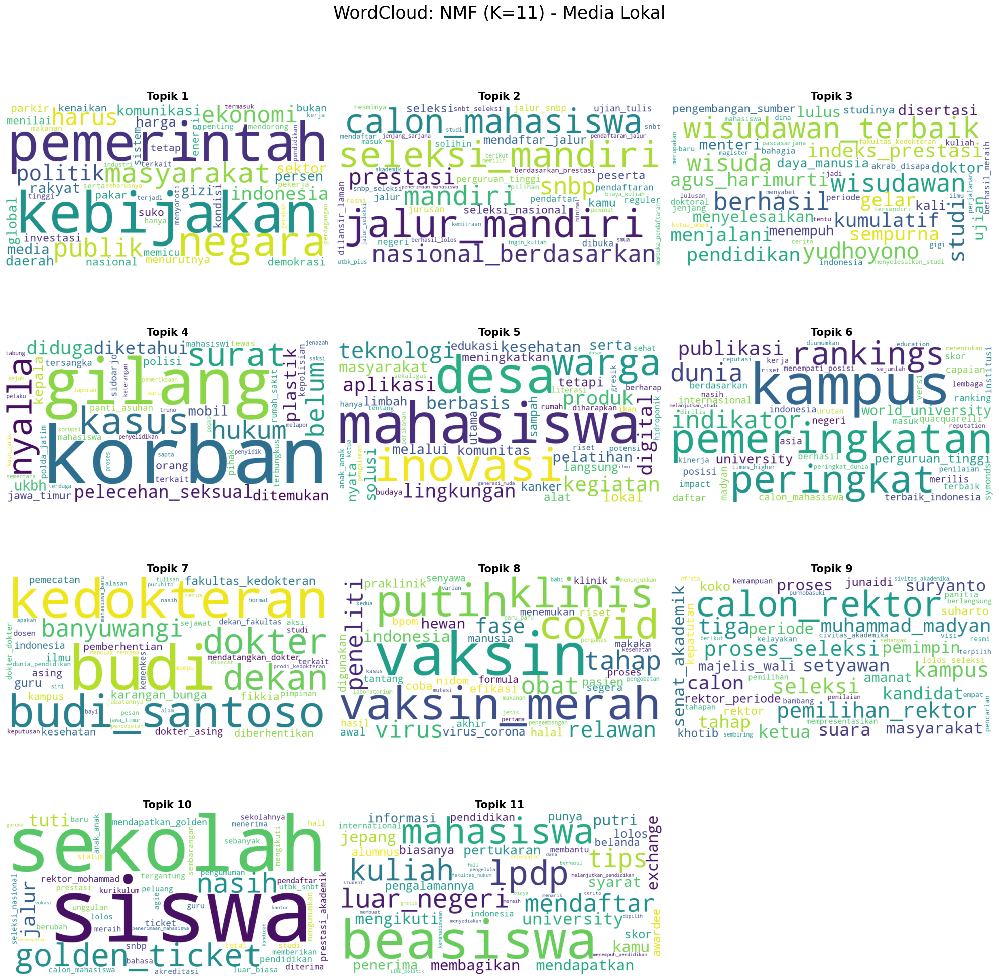


[2/6] Memproses LDA (K=10)...
   ✅ Grafik tersimpan: WORDCLOUD_LDA_K10.png


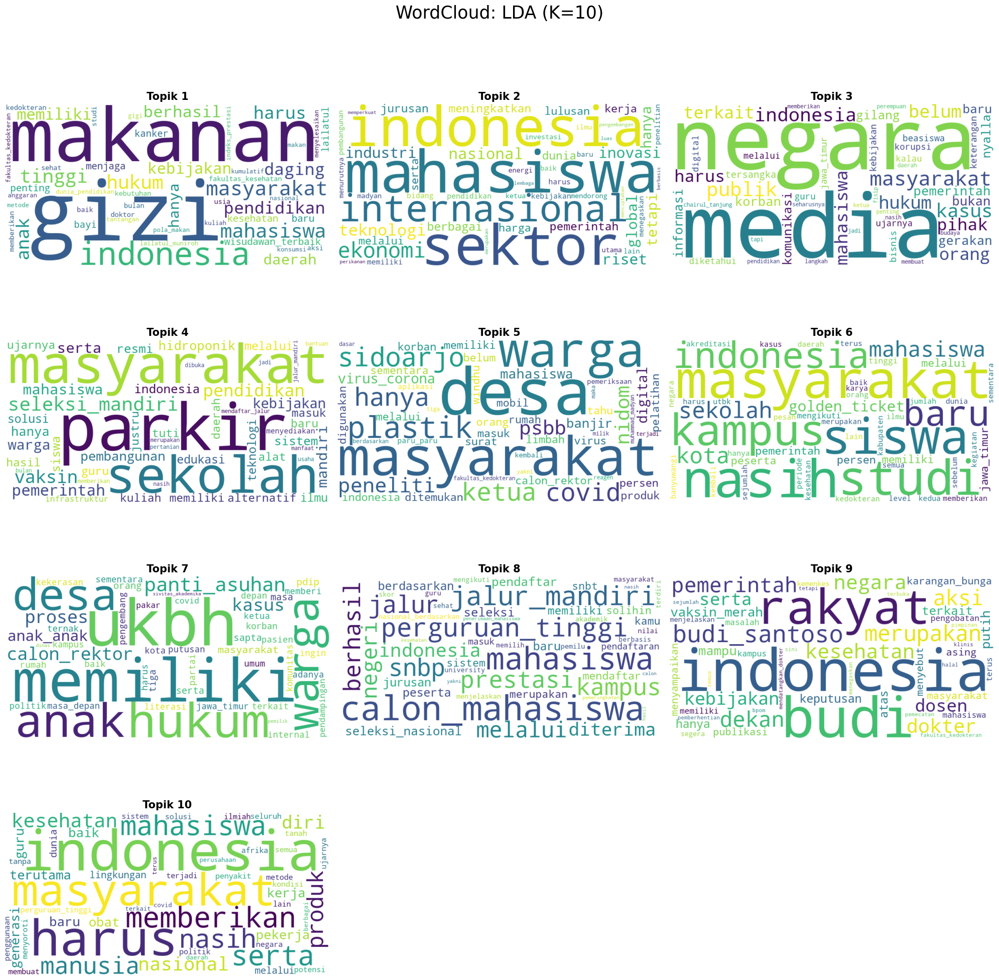


[3/6] Memproses LSA (K=3)...
   ✅ Grafik tersimpan: WORDCLOUD_LSA_K3.png


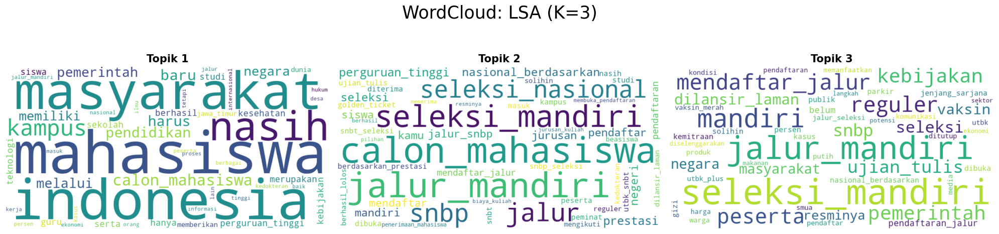


[4/6] Memproses PLSA (K=8)...
   ✅ Grafik tersimpan: WORDCLOUD_PLSA_K8.png


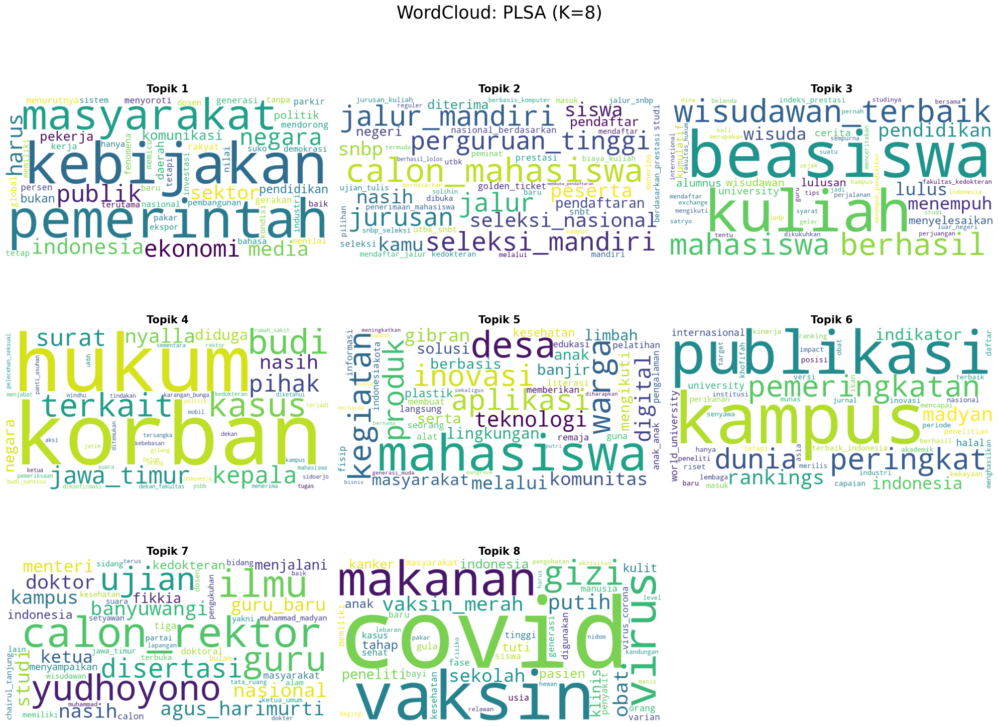


[5/6] Memproses K-Means (K=11)...
   ✅ Grafik tersimpan: WORDCLOUD_KMEANS_K11.png


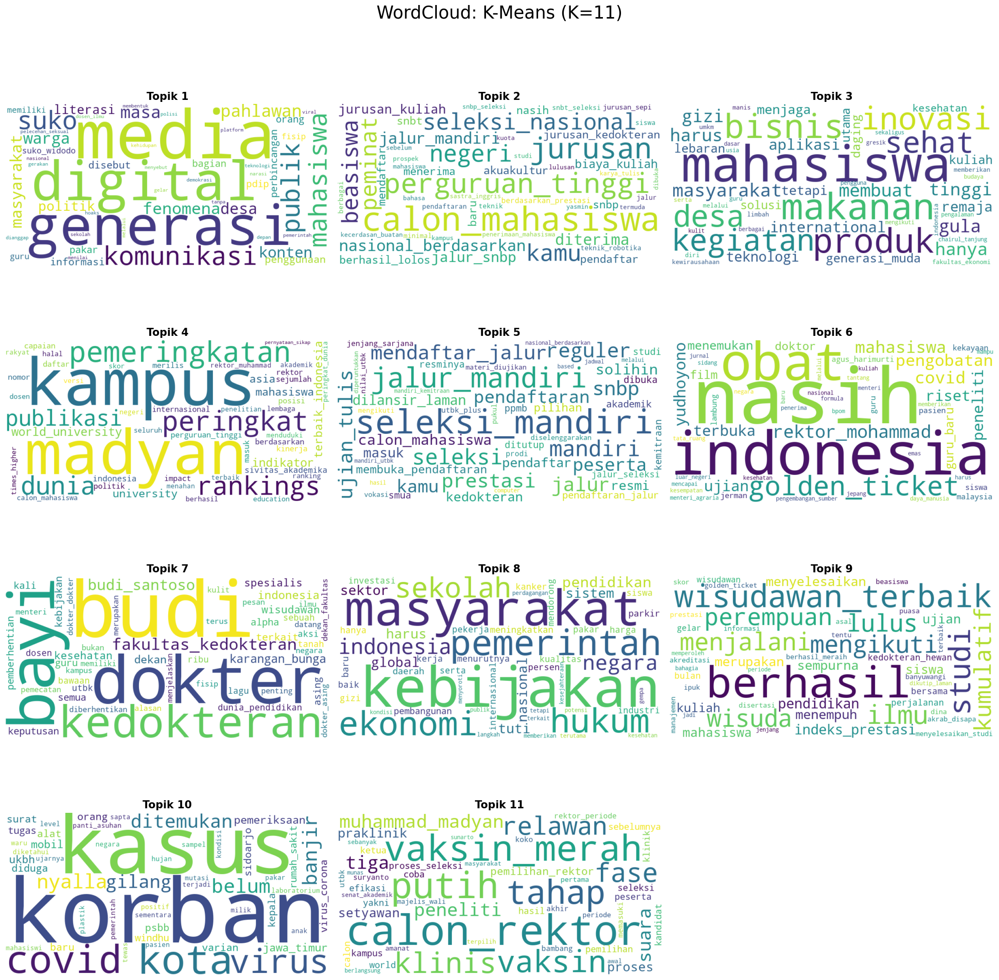


[6/6] Memproses BERTopic (IndoBERT)...
   ✅ Grafik tersimpan: WORDCLOUD_BERTOPIC.png


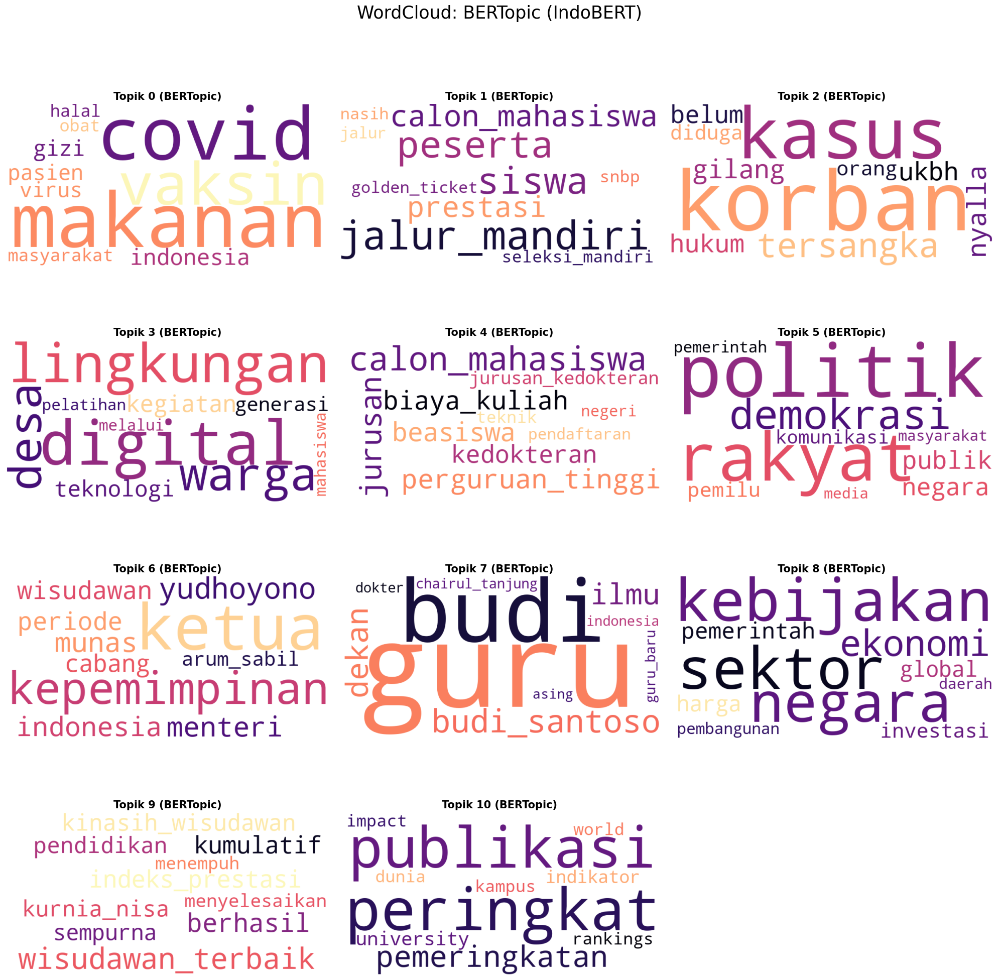


🎉 SELESAI! Semua visualisasi WordCloud telah disimpan.


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import math

# Pastikan library wordcloud terinstall: pip install wordcloud
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF, TruncatedSVD
from sklearn.cluster import KMeans
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

print("🚀 MEMULAI VISUALISASI WORDCLOUD PER TOPIK")
print("="*60)

# ==========================================
# 1. PERSIAPAN DATA & VECTORIZER
# ==========================================
# Cek apakah docs_final ada di memory
if 'docs_final' not in locals():
    try:
        df = pd.read_csv('DATASET_UNAIR_CLEAN.csv')
        col = 'Clean_Content' if 'Clean_Content' in df.columns else 'Isi_Berita'
        docs_viz = df[col].dropna().tolist()
        print(f"-> Data Loaded from CSV: {len(docs_viz)} docs")
    except:
        print("[ERROR] Data tidak ditemukan. Pastikan file csv ada.")
        docs_viz = []
else:
    docs_viz = docs_final
    print(f"-> Data Loaded from Memory: {len(docs_viz)} docs")

if docs_viz:
    print("1. Menyiapkan Vectorizer...")
    # TF-IDF untuk NMF, LSA, PLSA, KMeans
    tfidf_vec = TfidfVectorizer(max_df=0.95, min_df=2)
    tfidf_matrix = tfidf_vec.fit_transform(docs_viz)
    feat_tfidf = tfidf_vec.get_feature_names_out()

    # Count Vectorizer untuk LDA
    tf_vec = CountVectorizer(max_df=0.95, min_df=2)
    tf_matrix = tf_vec.fit_transform(docs_viz)
    feat_tf = tf_vec.get_feature_names_out()
    
    # --- FUNGSI GENERATE WORDCLOUD (Classic Models) ---
    def plot_wordclouds_classic(model, feature_names, title, filename, n_top_words=50):
        # Cek apakah model adalah KMeans (atributnya cluster_centers_) atau yang lain (components_)
        if hasattr(model, 'components_'):
            topics = model.components_
        elif hasattr(model, 'cluster_centers_'):
            topics = model.cluster_centers_
        else:
            print("Model tidak dikenali.")
            return

        n_topics = len(topics)
        # Bikin Grid (misal 3 kolom)
        n_cols = 3
        n_rows = math.ceil(n_topics / n_cols)
        
        plt.figure(figsize=(20, 5 * n_rows))
        
        for topic_idx, topic in enumerate(topics):
            # Ambil n kata teratas dengan bobotnya
            top_features_ind = topic.argsort()[:-n_top_words - 1:-1]
            
            # Buat dictionary {kata: bobot} untuk WordCloud
            # Note: Untuk LSA, kita pakai abs() karena ada nilai negatif
            freqs = {feature_names[i]: np.abs(topic[i]) for i in top_features_ind}
            
            wc = WordCloud(background_color="white", 
                           max_words=n_top_words, 
                           width=800, height=400,
                           colormap='viridis').generate_from_frequencies(freqs)
            
            plt.subplot(n_rows, n_cols, topic_idx + 1)
            plt.imshow(wc, interpolation='bilinear')
            plt.title(f'Topik {topic_idx + 1}', fontsize=15, fontweight='bold')
            plt.axis("off")

        plt.suptitle(f'WordCloud: {title}', fontsize=25, y=1.02)
        plt.tight_layout()
        plt.savefig(filename, bbox_inches='tight')
        print(f"   ✅ Grafik tersimpan: {filename}")
        plt.show()

    # --- FUNGSI GENERATE WORDCLOUD (BERTopic) ---
    def plot_wordclouds_bertopic(bert_model, title, filename):
        topic_info = bert_model.get_topic_info()
        # Ambil topik valid (kecuali outlier -1)
        valid_topics = topic_info[topic_info['Topic'] != -1]['Topic'].tolist()
        # Batasi max 12 topik agar gambar tidak terlalu berat
        valid_topics = valid_topics[:12] 
        
        n_topics = len(valid_topics)
        if n_topics == 0:
            print("Tidak ada topik valid ditemukan.")
            return

        n_cols = 3
        n_rows = math.ceil(n_topics / n_cols)
        
        plt.figure(figsize=(20, 5 * n_rows))
        
        for idx, topic_id in enumerate(valid_topics):
            words_scores = bert_model.get_topic(topic_id)
            if not words_scores: continue
            
            # Buat dictionary {kata: c-TF-IDF score}
            freqs = {item[0]: item[1] for item in words_scores}
            
            wc = WordCloud(background_color="white", 
                           max_words=50, 
                           width=800, height=400,
                           colormap='magma').generate_from_frequencies(freqs)
            
            plt.subplot(n_rows, n_cols, idx + 1)
            plt.imshow(wc, interpolation='bilinear')
            plt.title(f'Topik {topic_id} (BERTopic)', fontsize=15, fontweight='bold')
            plt.axis("off")
            
        plt.suptitle(f'WordCloud: {title}', fontsize=25, y=1.02)
        plt.tight_layout()
        plt.savefig(filename, bbox_inches='tight')
        print(f"   ✅ Grafik tersimpan: {filename}")
        plt.show()

    # ==========================================
    # 2. EKSEKUSI MODEL & WORDCLOUD
    # ==========================================

    # --- MODEL 1: NMF (K=11) [PEMENANG LOKAL] ---
    print("\n[1/6] Memproses NMF (K=11)...")
    nmf = NMF(n_components=11, init='nndsvd', random_state=42).fit(tfidf_matrix)
    plot_wordclouds_classic(nmf, feat_tfidf, "NMF (K=11) - Media Lokal", "WORDCLOUD_NMF_K11.png")

    # --- MODEL 2: LDA (K=10) ---
    print("\n[2/6] Memproses LDA (K=10)...")
    lda = LatentDirichletAllocation(n_components=10, random_state=42).fit(tf_matrix)
    plot_wordclouds_classic(lda, feat_tf, "LDA (K=10)", "WORDCLOUD_LDA_K10.png")

    # --- MODEL 3: LSA (K=3) ---
    print("\n[3/6] Memproses LSA (K=3)...")
    lsa = TruncatedSVD(n_components=3, random_state=42).fit(tfidf_matrix)
    plot_wordclouds_classic(lsa, feat_tfidf, "LSA (K=3)", "WORDCLOUD_LSA_K3.png")

    # --- MODEL 4: PLSA (K=8) ---
    print("\n[4/6] Memproses PLSA (K=8)...")
    plsa = NMF(n_components=8, solver='mu', beta_loss='kullback-leibler', random_state=42).fit(tfidf_matrix)
    plot_wordclouds_classic(plsa, feat_tfidf, "PLSA (K=8)", "WORDCLOUD_PLSA_K8.png")

    # --- MODEL 5: K-Means (K=11) ---
    print("\n[5/6] Memproses K-Means (K=11)...")
    kmeans = KMeans(n_clusters=11, random_state=42, n_init=10).fit(tfidf_matrix)
    plot_wordclouds_classic(kmeans, feat_tfidf, "K-Means (K=11)", "WORDCLOUD_KMEANS_K11.png")

    # --- MODEL 6: BERTopic (IndoBERT) [PEMENANG INTERNASIONAL] ---
    print("\n[6/6] Memproses BERTopic (IndoBERT)...")
    try:
        embedding_model = SentenceTransformer('firqaaa/indo-sentence-bert-base')
        bert_model = BERTopic(embedding_model=embedding_model, language="indonesian", verbose=False)
        bert_model.fit_transform(docs_viz)
        
        plot_wordclouds_bertopic(bert_model, "BERTopic (IndoBERT)", "WORDCLOUD_BERTOPIC.png")
        
    except Exception as e:
        print(f"   [SKIP] BERTopic error: {e}")

    print("\n🎉 SELESAI! Semua visualisasi WordCloud telah disimpan.")

else:
    print("Tidak ada data.")

🚀 MEMULAI EDA: WORDCLOUD MEDIA LOKAL INDONESIA
-> Data Berhasil Dimuat: 417 baris

[1/2] Membuat WordCloud TOTAL (Semua Media)...
   ✅ Tersimpan: WC_TOTAL_LOKAL.png


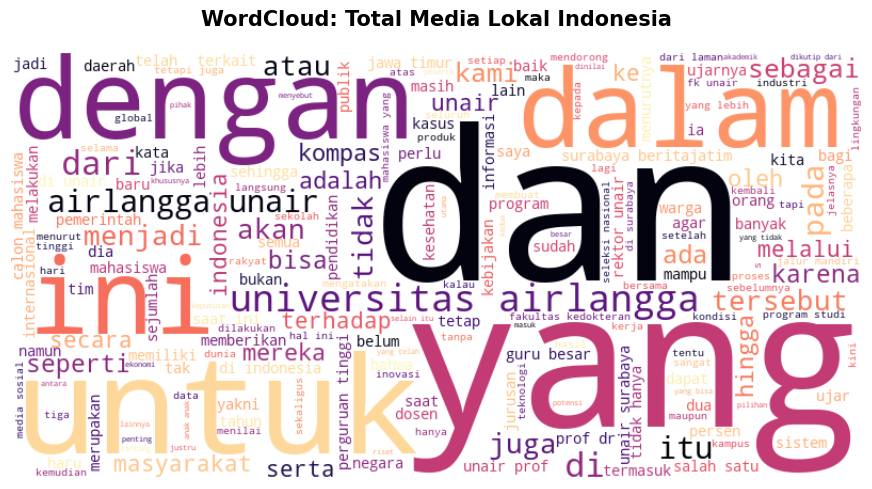


[2/2] Membuat WordCloud PER MEDIA...
   -> Memproses: Kompas...
   ✅ Tersimpan: WC_KOMPAS.png


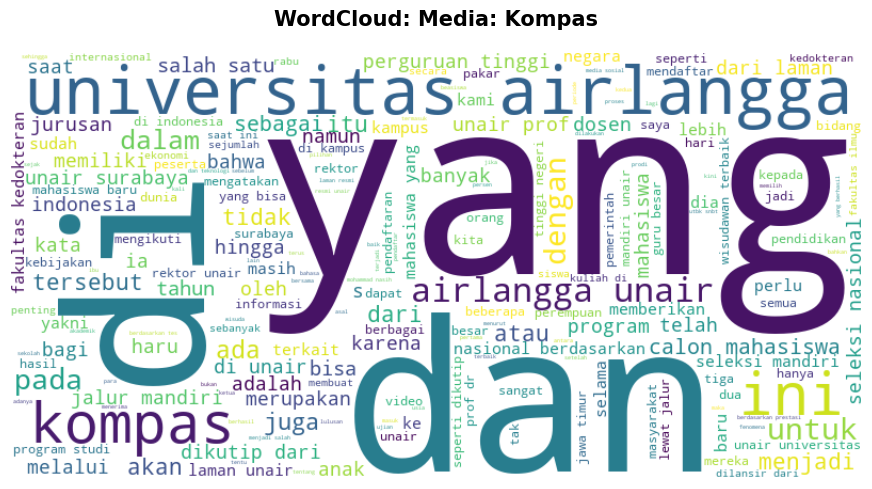

   -> Memproses: CNN Indonesia...
   ✅ Tersimpan: WC_CNN_INDONESIA.png


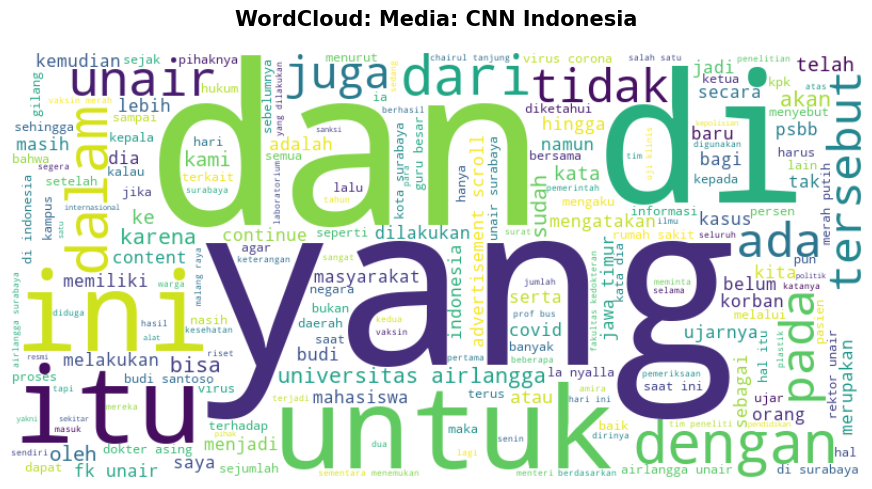

   -> Memproses: Beritajatim...
   ✅ Tersimpan: WC_BERITAJATIM.png


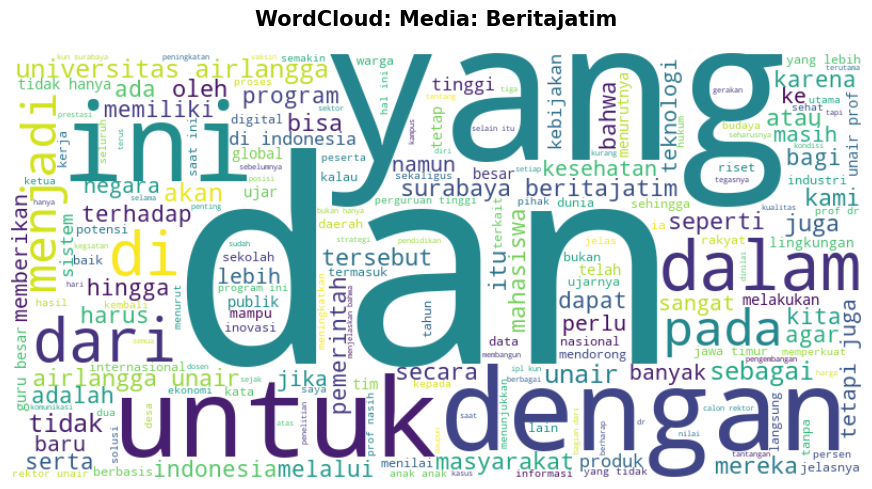


🎉 SELESAI! Cek file gambar (WC_*.png) di folder Anda.


In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

print("🚀 MEMULAI EDA: WORDCLOUD MEDIA LOKAL INDONESIA")
print("="*60)

# 1. LOAD DATA
try:
    df = pd.read_csv('DATASET_UNAIR_CLEAN.csv')
    # Pastikan tidak ada nilai null di kolom teks
    df = df.dropna(subset=['Clean_Content'])
    print(f"-> Data Berhasil Dimuat: {len(df)} baris")
except FileNotFoundError:
    print("[ERROR] File 'DATASET_UNAIR_CLEAN.csv' tidak ditemukan. Jalankan cleaning dulu.")
    df = pd.DataFrame()

if not df.empty:
    # Fungsi sederhana untuk membuat dan menyimpan WordCloud
    def generate_save_wordcloud(text_data, title, filename, color_map='viridis'):
        if not text_data.strip(): # Cek jika teks kosong
            print(f"   [SKIP] Tidak ada teks untuk {title}")
            return

        # Buat WordCloud
        wc = WordCloud(
            width=800, 
            height=400, 
            background_color='white', 
            colormap=color_map,
            max_words=200,
            contour_width=1, 
            contour_color='steelblue'
        ).generate(text_data)

        # Plotting
        plt.figure(figsize=(10, 5))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'WordCloud: {title}', fontsize=15, fontweight='bold', pad=20)
        plt.tight_layout()
        
        # Simpan & Tampilkan
        save_path = f"WC_{filename}.png"
        plt.savefig(save_path, dpi=300)
        print(f"   ✅ Tersimpan: {save_path}")
        plt.show()

    # ==========================================================
    # A. WORDCLOUD TOTAL (GABUNGAN SEMUA MEDIA LOKAL)
    # ==========================================================
    print("\n[1/2] Membuat WordCloud TOTAL (Semua Media)...")
    total_text = " ".join(df['Clean_Content'].astype(str).tolist())
    generate_save_wordcloud(total_text, "Total Media Lokal Indonesia", "TOTAL_LOKAL", "magma")

    # ==========================================================
    # B. WORDCLOUD PER MEDIA (KOMPAS, CNN, BERITAJATIM)
    # ==========================================================
    print("\n[2/2] Membuat WordCloud PER MEDIA...")
    
    # Cek kolom 'Media' ada atau tidak (sesuai dataset scraping Anda)
    if 'Media' in df.columns:
        media_list = df['Media'].unique()
        
        for media in media_list:
            print(f"   -> Memproses: {media}...")
            # Ambil teks hanya untuk media tersebut
            media_text = " ".join(df[df['Media'] == media]['Clean_Content'].astype(str).tolist())
            
            # Bersihkan nama file (hapus spasi/karakter aneh)
            safe_filename = media.replace(" ", "_").upper()
            
            generate_save_wordcloud(media_text, f"Media: {media}", safe_filename, "viridis")
    else:
        print("   [WARNING] Kolom 'Media' tidak ditemukan di dataset. Skip WordCloud per media.")

    print("\n🎉 SELESAI! Cek file gambar (WC_*.png) di folder Anda.")
else:
    print("Tidak ada data untuk diproses.")

🚀 MEMULAI EDA: WORDCLOUD (DENGAN DOCS_FINAL BIGRAM)

[1/2] Membuat WordCloud TOTAL...
   -> Menggunakan 'docs_final' dari memori (Kualitas Terbaik: Ada Bigram)
   ✅ Tersimpan: WC_TOTAL_LOKAL_BIGRAM.png


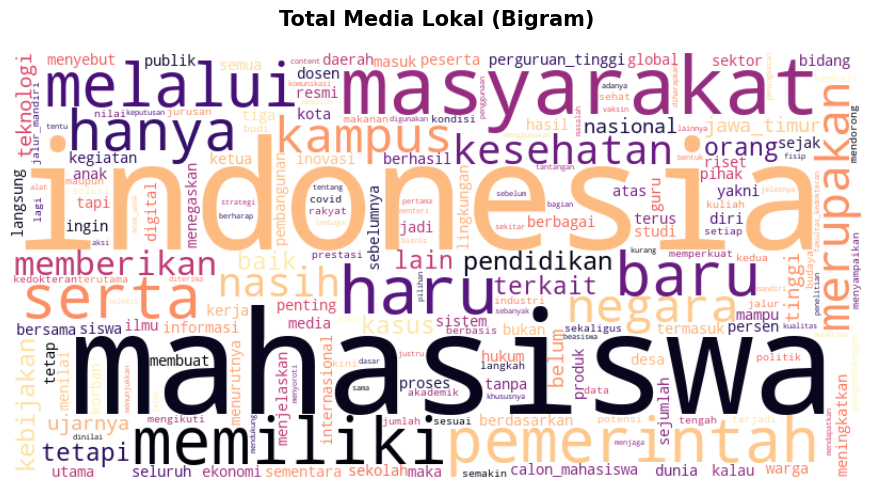


[2/2] Membuat WordCloud PER MEDIA...
   -> Memproses: Kompas...
   ✅ Tersimpan: WC_KOMPAS.png


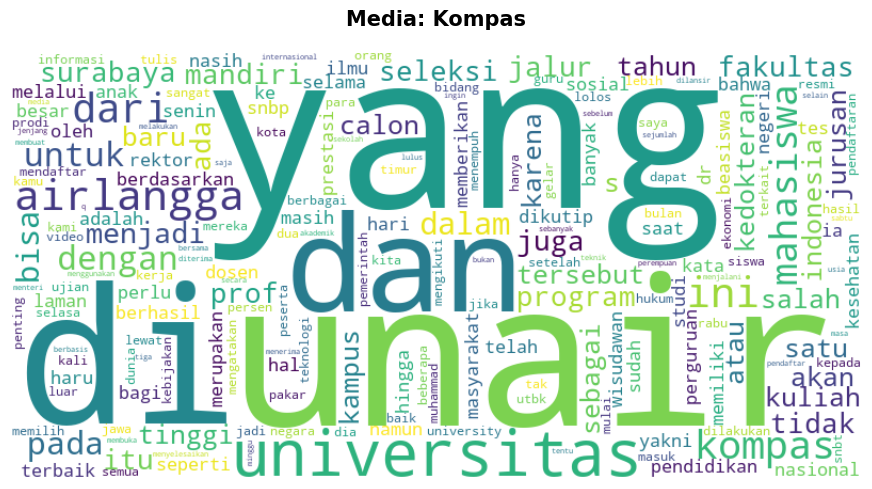

   -> Memproses: CNN Indonesia...
   ✅ Tersimpan: WC_CNN_INDONESIA.png


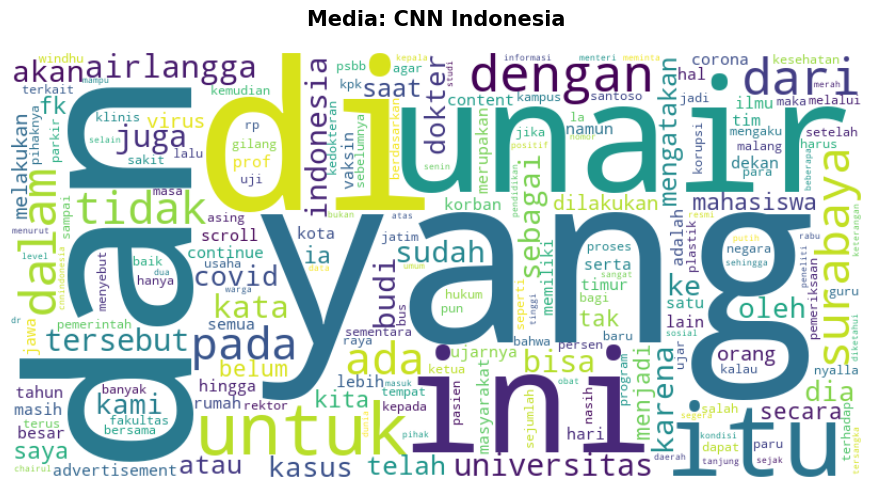

   -> Memproses: Beritajatim...
   ✅ Tersimpan: WC_BERITAJATIM.png


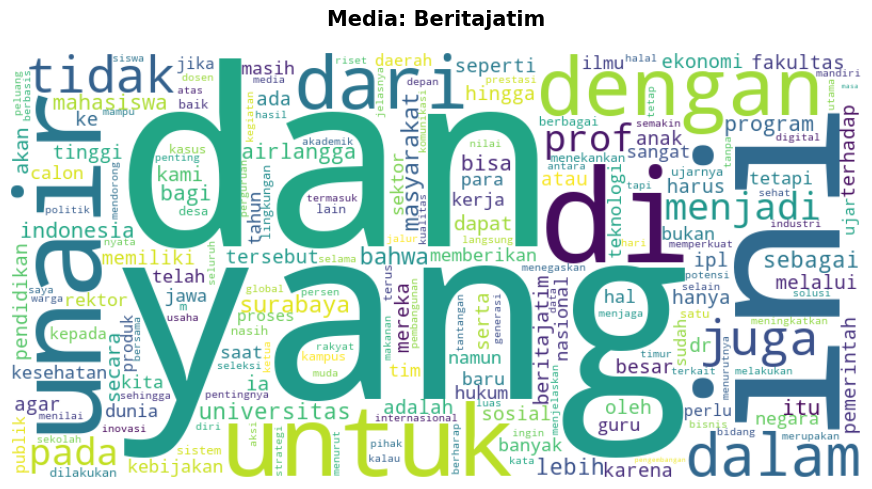


🎉 SELESAI!


In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

print("🚀 MEMULAI EDA: WORDCLOUD (DENGAN DOCS_FINAL BIGRAM)")
print("="*60)

# --- FUNGSI PEMBUAT WORDCLOUD ---
def generate_save_wordcloud(text_data, title, filename, color_map='viridis'):
    if not text_data.strip():
        print(f"   [SKIP] Tidak ada teks untuk {title}")
        return

    wc = WordCloud(
        width=800, 
        height=400, 
        background_color='white', 
        colormap=color_map,
        max_words=200,
        contour_width=1, 
        contour_color='steelblue',
        collocations=False # Set False karena kita sudah punya bigram sendiri di docs_final
    ).generate(text_data)

    plt.figure(figsize=(10, 5))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'{title}', fontsize=15, fontweight='bold', pad=20)
    plt.tight_layout()
    
    save_path = f"WC_{filename}.png"
    plt.savefig(save_path, dpi=300)
    print(f"   ✅ Tersimpan: {save_path}")
    plt.show()

# ==========================================================
# A. WORDCLOUD TOTAL (MENGGUNAKAN DOCS_FINAL / BIGRAM)
# ==========================================================
print("\n[1/2] Membuat WordCloud TOTAL...")

# Cek apakah variabel docs_final ada di memori (dari kode modelling sebelumnya)
if 'docs_final' in locals() and len(docs_final) > 0:
    print("   -> Menggunakan 'docs_final' dari memori (Kualitas Terbaik: Ada Bigram)")
    # Gabungkan semua dokumen di docs_final menjadi satu string raksasa
    total_text = " ".join(docs_final)
else:
    print("   -> 'docs_final' tidak ditemukan. Fallback ke CSV (Tanpa Bigram)")
    try:
        df_temp = pd.read_csv('DATASET_UNAIR_CLEAN.csv')
        total_text = " ".join(df_temp['Clean_Content'].dropna().astype(str).tolist())
    except:
        print("   [ERROR] Tidak ada data sama sekali.")
        total_text = ""

if total_text:
    generate_save_wordcloud(total_text, "Total Media Lokal (Bigram)", "TOTAL_LOKAL_BIGRAM", "magma")


# ==========================================================
# B. WORDCLOUD PER MEDIA (MENGGUNAKAN CSV ASLI)
# ==========================================================
# Kita pakai CSV di sini karena docs_final sudah kehilangan label 'Media'-nya
print("\n[2/2] Membuat WordCloud PER MEDIA...")

try:
    df = pd.read_csv('DATASET_UNAIR_CLEAN.csv')
    df = df.dropna(subset=['Clean_Content'])
    
    if 'Media' in df.columns:
        media_list = df['Media'].unique()
        
        for media in media_list:
            print(f"   -> Memproses: {media}...")
            
            # Ambil teks
            media_data = df[df['Media'] == media]['Clean_Content'].astype(str).tolist()
            media_text = " ".join(media_data)
            
            # Bersihkan nama file
            safe_filename = media.replace(" ", "_").upper()
            
            generate_save_wordcloud(media_text, f"Media: {media}", safe_filename, "viridis")
    else:
        print("   [WARNING] Kolom 'Media' tidak ditemukan di CSV.")

except Exception as e:
    print(f"   [ERROR] Gagal memproses per media: {e}")

print("\n🎉 SELESAI!")

🚀 MEMULAI EDA LENGKAP (PREPROCESSING + VISUALISASI)

[1/3] Memuat dan Membersihkan Data...
      -> Membuat Bigrams (Frasa kata)...
      -> Selesai! Jumlah data bersih: 417

[2/3] Membuat WordCloud TOTAL (Semua Data)...
   ✅ Tersimpan: WC_TOTAL_LOKAL_FINAL.png


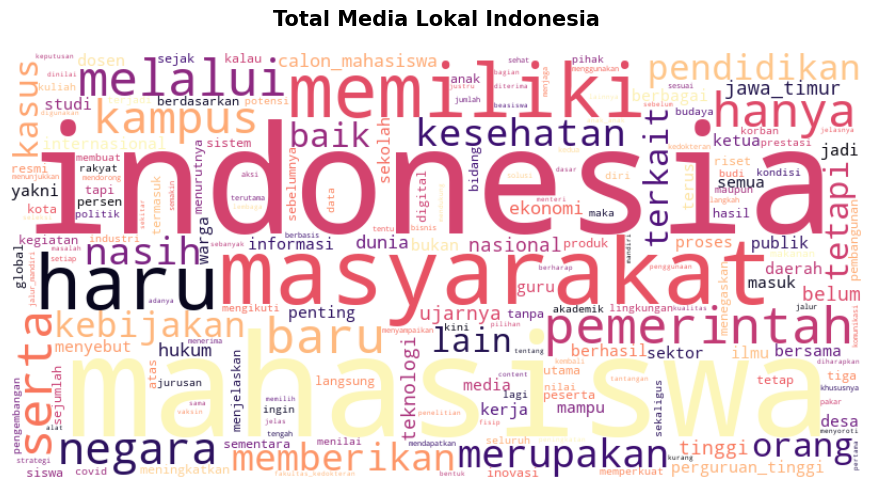


[3/3] Membuat WordCloud PER MEDIA...
      -> Memproses: Kompas...
   ✅ Tersimpan: WC_KOMPAS.png


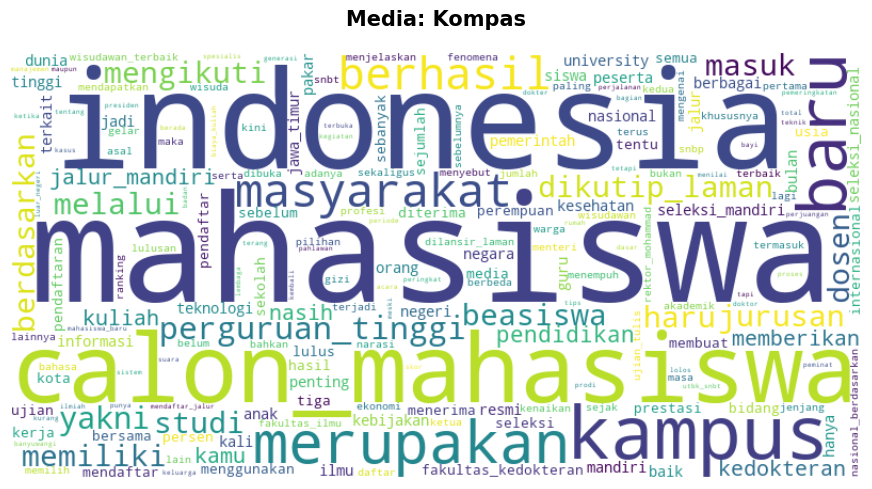

      -> Memproses: CNN Indonesia...
   ✅ Tersimpan: WC_CNN_INDONESIA.png


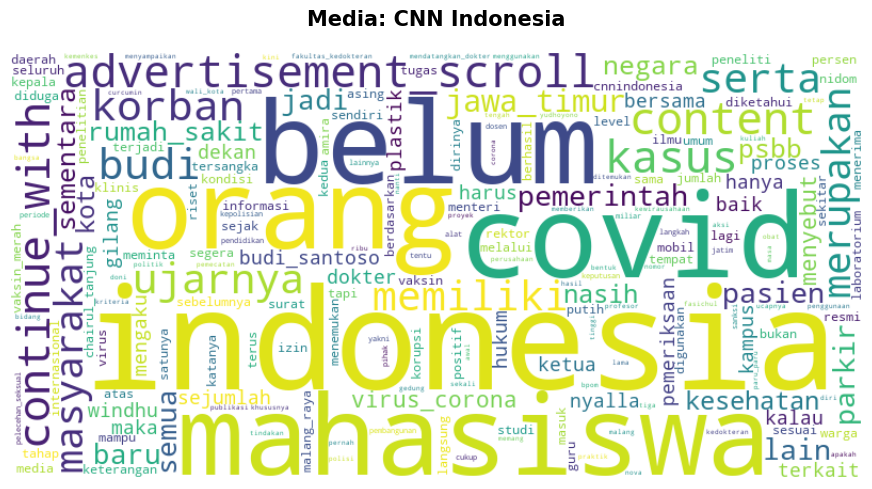

      -> Memproses: Beritajatim...
   ✅ Tersimpan: WC_BERITAJATIM.png


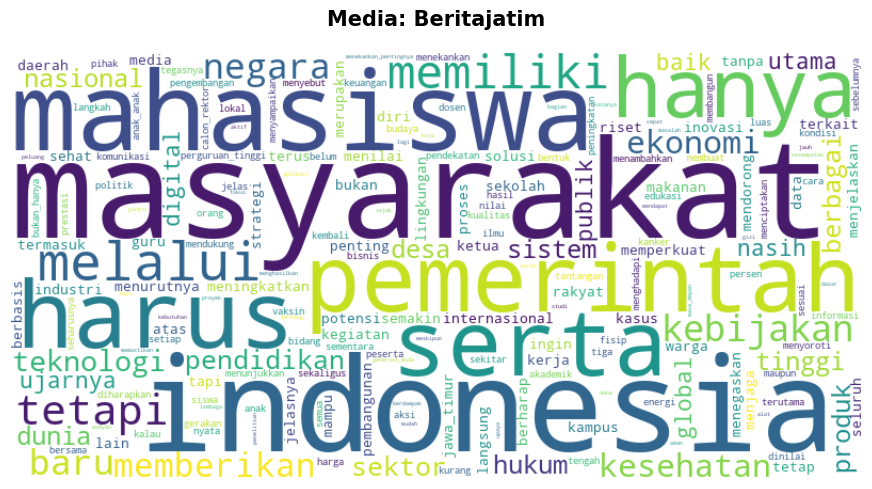


🎉 SELESAI SEMUA!


In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
from wordcloud import WordCloud
from gensim.models.phrases import Phrases, Phraser

print("🚀 MEMULAI EDA LENGKAP (PREPROCESSING + VISUALISASI)")
print("="*60)

# ==============================================================================
# TAHAP 1: DEFINISI STOPWORDS & FUNGSI CLEANING (SAMA SEPERTI MODELLING)
# ==============================================================================

# 1. Stopwords Custom (Sesuai kode modelling Anda)
stopwords_indo = set([
    'yang', 'dan', 'di', 'ke', 'dari', 'ini', 'itu', 'untuk', 'pada', 'adalah',
    'baca', 'juga', 'halaman', 'penulis', 'editor', 'foto', 'video', 'kompas', 
    'cnn', 'beritajatim', 'surabaya', 'unair', 'universitas', 'airlangga', 'prof',
    'dr', 'lewat', 'lanjut', 'selengkapnya', 'simak', 'buka', 'tutup', 'news',
    'kami', 'kita', 'mereka', 'akan', 'bisa', 'ada', 'saat', 'dalam', 'dengan',
    'tidak', 'menjadi', 'sebagai', 'bahwa', 'lebih', 'sosial', 'program', 'bagi',
    'atau', 'karena', 'namun', 'ia', 'dia', 'pihaknya', 'saya', 'anda', 'hal',
    'tersebut', 'oleh', 'secara', 'telah', 'sudah', 'masih', 'jika', 'tak',
    'lalu', 'kemudian', 'seperti', 'saja', 'mulai', 'hingga', 'sampai',
    'terhadap', 'dilakukan', 'melakukan', 'antara', 'setelah', 'beberapa',
    'selama', 'selain', 'banyak', 'perlu', 'dapat', 'kata', 'ujar', 'tutur',
    'menurut', 'mengatakan', 'kepada', 'sehingga', 'sangat', 'agar', 'pun',
    'sedang', 'besar', 'salah', 'satu', 'para', 'wib', 'jumat', 'senin',
    'selasa', 'rabu', 'kamis', 'sabtu', 'minggu', 'januari', 'februari',
    'maret', 'april', 'mei', 'juni', 'juli', 'agustus', 'september', 
    'oktober', 'november', 'desember', 'tahun', 'hari', 'tanggal', 'waktu'
])

# 2. Fungsi Cleaning
def clean_text_indo(text):
    if not isinstance(text, str): return ""
    text = text.lower()
    text = re.sub(r'baca juga:.*', '', text) # Hapus "baca juga"
    text = re.sub(r'http\S+', '', text)      # Hapus URL
    text = re.sub(r'[^a-z\s]', ' ', text)    # Hapus simbol/angka
    # Hapus stopwords dan kata < 3 huruf
    text = ' '.join([w for w in text.split() if len(w) > 3 and w not in stopwords_indo])
    return text.strip()

# ==============================================================================
# TAHAP 2: LOAD DATA & PROSES PREPROCESSING
# ==============================================================================
print("\n[1/3] Memuat dan Membersihkan Data...")

try:
    # Load dataset (Gunakan yang LENGKAP/RAW agar kita bisa proses dari awal)
    # Jika Anda hanya punya yang CLEAN, ganti nama filenya, tapi pastikan kolomnya ada
    df = pd.read_csv('DATASET_UNAIR_CLEAN.csv') 
    
    # Deteksi nama kolom teks
    col_target = 'Clean_Content' if 'Clean_Content' in df.columns else 'Isi_Berita'
    
    # 1. Cleaning Awal
    df['temp_clean'] = df[col_target].apply(clean_text_indo)
    
    # 2. Filter data pendek (Sama seperti modelling: len > 30)
    df = df[df['temp_clean'].str.len() > 30].copy()
    
    # 3. Proses BIGRAM (Penting! Agar 'rumah sakit' jadi 'rumah_sakit')
    print("      -> Membuat Bigrams (Frasa kata)...")
    tokenized_docs = [doc.split() for doc in df['temp_clean']]
    
    # Latih model Bigram (Setting sama seperti modelling)
    phrases = Phrases(tokenized_docs, min_count=5, threshold=10)
    bigram_model = Phraser(phrases)
    
    # Terapkan Bigram ke data
    # Simpan hasil akhir di kolom baru 'Final_Text'
    df['Final_Text'] = [" ".join(bigram_model[doc]) for doc in tokenized_docs]
    
    print(f"      -> Selesai! Jumlah data bersih: {len(df)}")

except Exception as e:
    print(f"[ERROR] Gagal memproses data: {e}")
    df = pd.DataFrame()

# ==============================================================================
# TAHAP 3: VISUALISASI WORDCLOUD
# ==============================================================================

if not df.empty:
    def generate_save_wordcloud(text_data, title, filename, color_map='viridis'):
        if not text_data.strip(): return

        # collocations=False PENTING karena kita sudah bikin Bigram sendiri
        wc = WordCloud(
            width=800, height=400, 
            background_color='white', 
            colormap=color_map,
            max_words=200,
            contour_width=1, contour_color='steelblue',
            collocations=False  
        ).generate(text_data)

        plt.figure(figsize=(10, 5))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'{title}', fontsize=15, fontweight='bold', pad=20)
        plt.tight_layout()
        
        plt.savefig(f"WC_{filename}.png", dpi=300)
        print(f"   ✅ Tersimpan: WC_{filename}.png")
        plt.show()

    # --- A. WORDCLOUD TOTAL ---
    print("\n[2/3] Membuat WordCloud TOTAL (Semua Data)...")
    total_text = " ".join(df['Final_Text'].tolist())
    generate_save_wordcloud(total_text, "Total Media Lokal Indonesia", "TOTAL_LOKAL_FINAL", "magma")

    # --- B. WORDCLOUD PER MEDIA ---
    print("\n[3/3] Membuat WordCloud PER MEDIA...")
    if 'Media' in df.columns:
        media_list = df['Media'].unique()
        for media in media_list:
            print(f"      -> Memproses: {media}...")
            # Ambil teks sesuai medianya
            media_text = " ".join(df[df['Media'] == media]['Final_Text'].tolist())
            
            safe_filename = media.replace(" ", "_").upper()
            generate_save_wordcloud(media_text, f"Media: {media}", safe_filename, "viridis")
    else:
        print("      [SKIP] Kolom 'Media' tidak ditemukan.")

    print("\n🎉 SELESAI SEMUA!")
else:
    print("Tidak ada data yang bisa diproses.")